# Setup

In [1]:
# import packages
%run ../global_packages.py

# get the global parameters
%run ../global_pars.py

# import your local functions
sys.path.insert(1, '../')
from global_functions import *

# make sure the figures plot inline rather than at the end
%matplotlib inline

# Paths

In [2]:
figpath = '../figures/'

# S1 - Annual Cycle All years 1993-2020

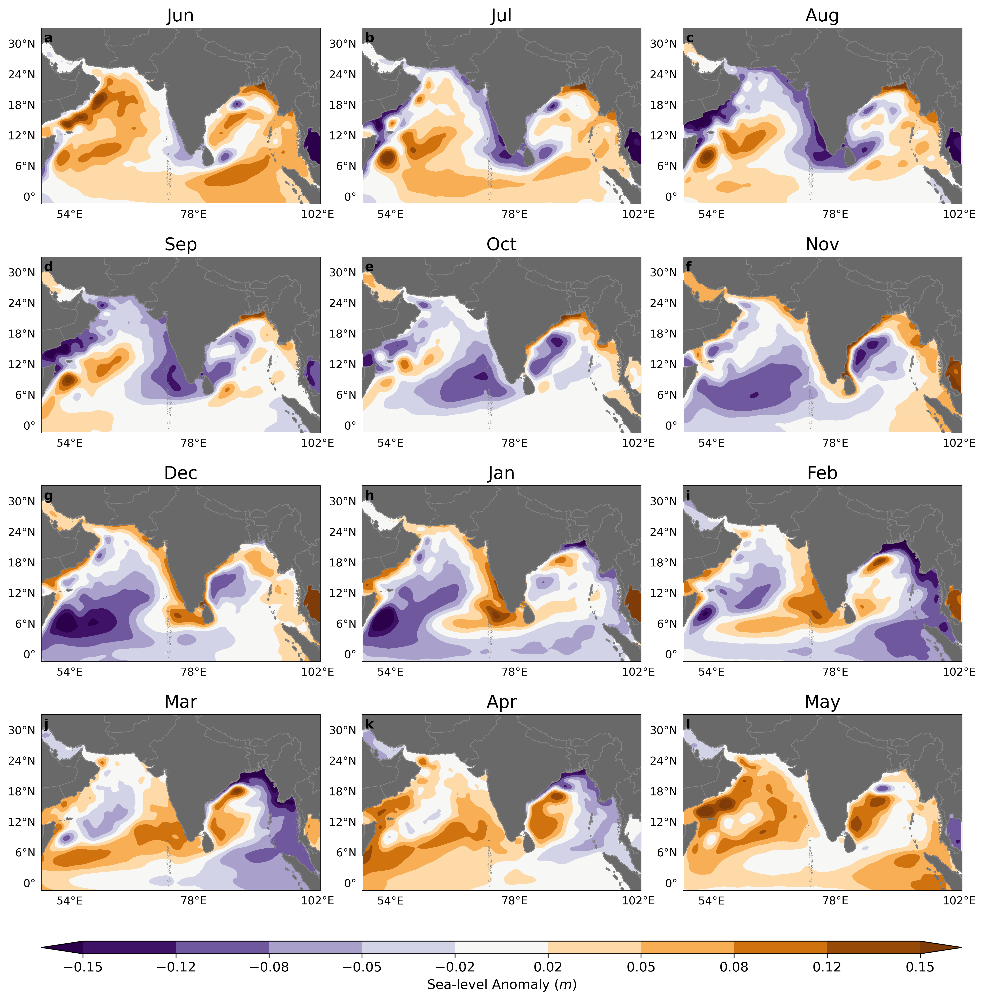

In [3]:
# SLA
ds_SLA = xr.open_dataset('../data_processing/2_SLA/sla_processed.nc')
ds_SLA

mon_sla_mon_clim = ds_SLA['mon_sla_mon_clim']
lat = mon_sla_mon_clim.lat.values
lon = mon_sla_mon_clim.lon.values

mon_sla_mon_clim = mon_sla_mon_clim.roll(month=-5,roll_coords = False)

fig = plt.figure(figsize=(15,16),dpi=400)

cmin = -0.15
cmax = 0.15

levels = np.round(np.linspace(cmin, cmax, 10),2)
sz = 30
fsz = 12
alpha = 0.25

params = {'legend.fontsize': 10,
         'axes.labelsize': 12,
         'axes.titlesize': 16,
         'xtick.labelsize':12,
         'ytick.labelsize':12}

pylab.rcParams.update(params)

months = ['Jun','Jul','Aug','Sep','Oct','Nov','Dec','Jan','Feb','Mar', 'Apr', 'May']
letters = ['a','b','c','d','e','f','g','h','i','j','k','l']
xx,yy = np.meshgrid(np.array(ds_SLA.lon),np.array(ds_SLA.lat))

##############################################################

for tt in range(12):
    ax = fig.add_subplot(4,3,tt+1,projection= ccrs.PlateCarree())
    c = ax.contourf(xx,yy,mon_sla_mon_clim[tt,:,:],
              levels = levels,cmap=plt.cm.PuOr_r,vmax=cmax,vmin=cmin, extend="both")

    g = add_land(ax, bounds = cm_bounds,countries = True)
    g.xlocator = mticker.FixedLocator([54,78,102])
    g.xlabel_style = {'size': 10}
    g.ylabel_style = {'size': 10}
    ax.set_title(months[tt])
    add_letter(ax, letters[tt], x = 0.01,y=0.92)
    
cbar_ax = fig.add_axes([0.125, 0.15, 0.775, 0.01])
cbar = fig.colorbar(c,cax=cbar_ax, pad=0.04, orientation = 'horizontal')
cbar.set_label('Sea-level Anomaly ($m$)')

plt.subplots_adjust(wspace = 0.15, hspace = 0.3,bottom = 0.2)

plt.savefig(figpath + 'Fig_S1_sla_annual_cycle.pdf', format='pdf', dpi = 400)

# S2 - Annual cycle during positive IOD phases

/home/jennap/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:161: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


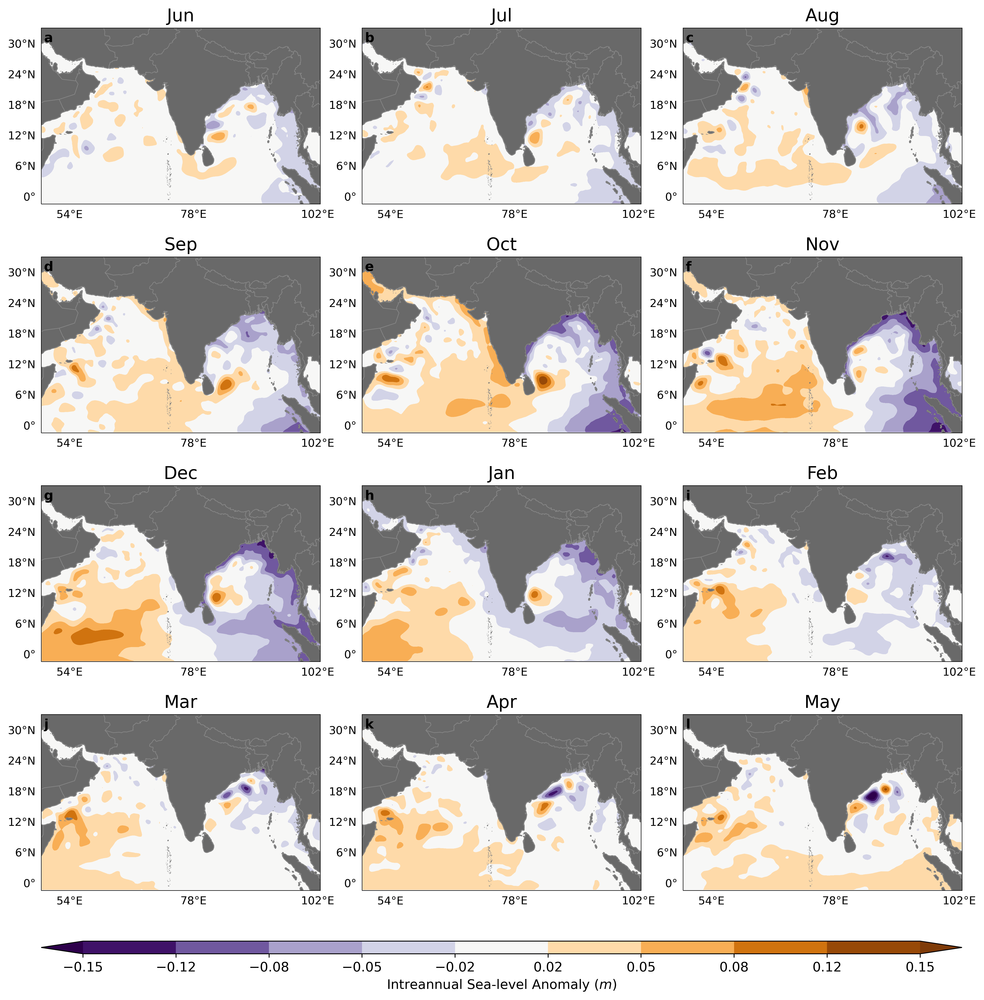

In [4]:
# SLA
ds_SLA = xr.open_dataset('../data_processing/2_SLA/sla_processed.nc')
ds_SLA

mon_sla_mon_anom = ds_SLA['mon_sla_mon_anom']
lat = mon_sla_mon_anom.lat.values
lon = mon_sla_mon_anom.lon.values

# load DMI data
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')
posIODyears = list(np.array(ds_DMI.pos_IOD_years)) 

# average over the positive IOD years 
posIOD_mon_sla_mon_anom,_ = IOD_year_group_grid(mon_sla_mon_anom,IODyear_begin,IODyear_end,posIODyears)


fig = plt.figure(figsize=(15,16),dpi=400)

cmin = -0.15
cmax = 0.15

levels = np.round(np.linspace(cmin, cmax, 10),2)
sz = 30
fsz = 12
alpha = 0.25

params = {'legend.fontsize': 10,
         'axes.labelsize': 12,
         'axes.titlesize': 16,
         'xtick.labelsize':12,
         'ytick.labelsize':12}

pylab.rcParams.update(params)

months = ['Jun','Jul','Aug','Sep','Oct','Nov','Dec','Jan','Feb','Mar', 'Apr', 'May']
letters = ['a','b','c','d','e','f','g','h','i','j','k','l']
xx,yy = np.meshgrid(np.array(ds_SLA.lon),np.array(ds_SLA.lat))

##############################################################

for tt in range(12):
    ax = fig.add_subplot(4,3,tt+1,projection= ccrs.PlateCarree())
    c = ax.contourf(xx,yy,posIOD_mon_sla_mon_anom[tt,:,:],
              levels = levels,cmap=plt.cm.PuOr_r,vmax=cmax,vmin=cmin, extend="both")

    g = add_land(ax, bounds = cm_bounds,countries = True)
    g.xlocator = mticker.FixedLocator([54,78,102])
    g.xlabel_style = {'size': 10}
    g.ylabel_style = {'size': 10}
    ax.set_title(months[tt])
    add_letter(ax, letters[tt], x = 0.01,y=0.92)
    
cbar_ax = fig.add_axes([0.125, 0.15, 0.775, 0.01])
cbar = fig.colorbar(c,cax=cbar_ax, pad=0.04, orientation = 'horizontal')
cbar.set_label('Intreannual Sea-level Anomaly ($m$)')

plt.subplots_adjust(wspace = 0.15, hspace = 0.3,bottom = 0.2)

plt.savefig(figpath + 'Fig_S2_posiod_sla_annual_cycle.pdf', format='pdf', dpi = 400)

# S3 - Annual cycle during positive IOD phases

/home/jennap/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:161: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


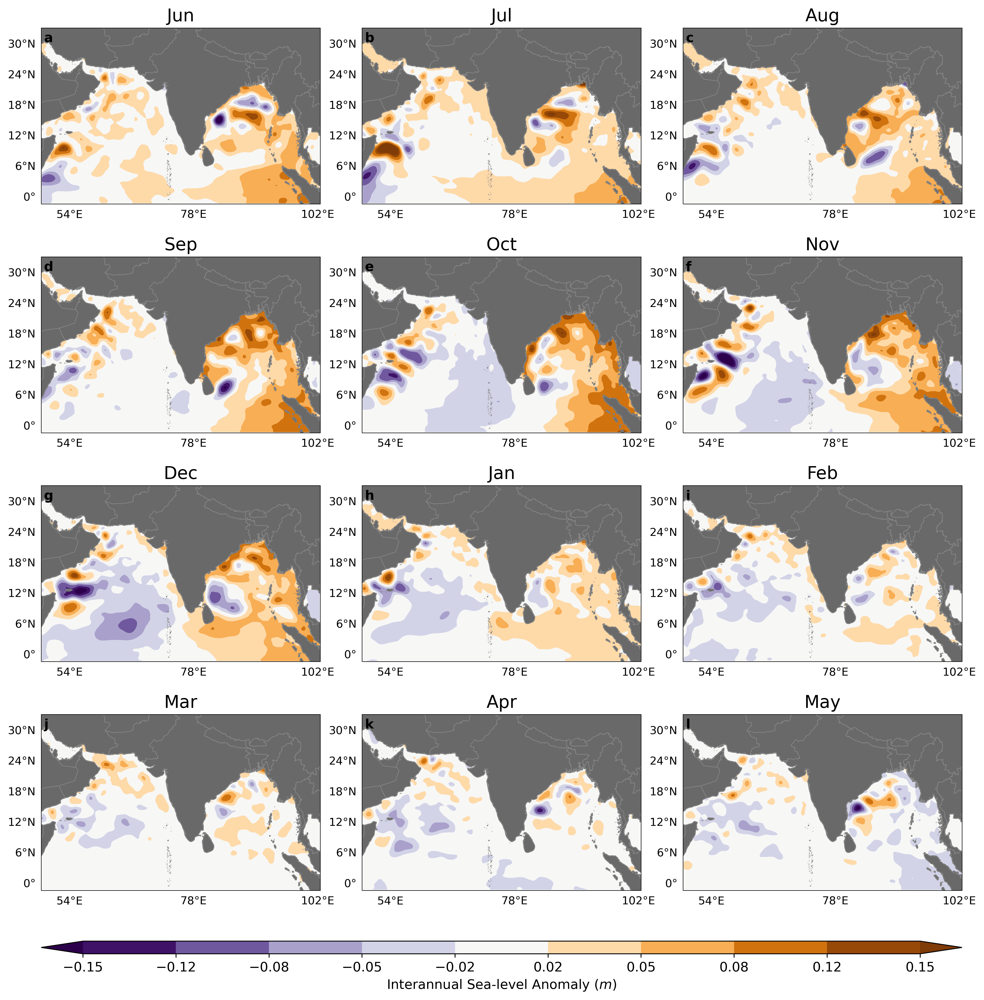

In [5]:
# SLA
ds_SLA = xr.open_dataset('../data_processing/2_SLA/sla_processed.nc')
ds_SLA

mon_sla_mon_anom = ds_SLA['mon_sla_mon_anom']
lat = mon_sla_mon_anom.lat.values
lon = mon_sla_mon_anom.lon.values

# load DMI data
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')
negIODyears = list(np.array(ds_DMI.neg_IOD_years)) 

# average over the negative IOD years
negIOD_mon_sla_mon_anom,_ = IOD_year_group_grid(mon_sla_mon_anom,IODyear_begin,IODyear_end,negIODyears)

fig = plt.figure(figsize=(15,16),dpi=400)

cmin = -0.15
cmax = 0.15

levels = np.round(np.linspace(cmin, cmax, 10),2)
sz = 30
fsz = 12
alpha = 0.25

params = {'legend.fontsize': 10,
         'axes.labelsize': 12,
         'axes.titlesize': 16,
         'xtick.labelsize':12,
         'ytick.labelsize':12}

pylab.rcParams.update(params)

months = ['Jun','Jul','Aug','Sep','Oct','Nov','Dec','Jan','Feb','Mar', 'Apr', 'May']
letters = ['a','b','c','d','e','f','g','h','i','j','k','l']
xx,yy = np.meshgrid(np.array(ds_SLA.lon),np.array(ds_SLA.lat))

##############################################################

for tt in range(12):
    ax = fig.add_subplot(4,3,tt+1,projection= ccrs.PlateCarree())
    c = ax.contourf(xx,yy,negIOD_mon_sla_mon_anom[tt,:,:],
              levels = levels,cmap=plt.cm.PuOr_r,vmax=cmax,vmin=cmin, extend="both")

    g = add_land(ax, bounds = cm_bounds,countries = True)
    g.xlocator = mticker.FixedLocator([54,78,102])
    g.xlabel_style = {'size': 10}
    g.ylabel_style = {'size': 10}
    ax.set_title(months[tt])
    add_letter(ax, letters[tt], x = 0.01,y=0.92)
    
cbar_ax = fig.add_axes([0.125, 0.15, 0.775, 0.01])
cbar = fig.colorbar(c,cax=cbar_ax, pad=0.04, orientation = 'horizontal')
cbar.set_label('Interannual Sea-level Anomaly ($m$)')

plt.subplots_adjust(wspace = 0.15, hspace = 0.3,bottom = 0.2)

plt.savefig(figpath + 'Fig_S3_negiod_sla_annual_cycle.pdf', format='pdf', dpi = 400)

# S4 - DMI and SLA Correlation Maps

In [6]:
# SLA
ds_SLA = xr.open_dataset('../data_processing/2_SLA/sla_processed.nc')
ds_SLA

mon_sla_mon_anom = ds_SLA['mon_sla_mon_anom']
lat = mon_sla_mon_anom.lat.values
lon = mon_sla_mon_anom.lon.values

xx,yy = np.meshgrid(np.array(ds_SLA.lon),np.array(ds_SLA.lat))
xx = xx.flatten()
yy = yy.flatten()

# load DMI data
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

#subset DMI to SLA time span
time_slice = slice('1993-01-01','2020-05-01')
dmi = ds_DMI['dmi'].sel(time = time_slice)

# find DMI seasons
season = np.ones(dmi.time.shape)
for tt in range(dmi.time.shape[0]):
    mm = dmi.time.dt.month[tt]
    if (mm == 12) | (mm == 1) | (mm == 2) | (mm == 3) | (mm == 4) | (mm == 5):
        season[tt] = 0    
   
    
# Interannual Anomaly Correlations
n = len(ds_SLA.lat)
m = len(ds_SLA.lon)
    
SLOPE_sla_dmi = np.full([n,m,2],np.nan)
INTERCEPT_sla_dmi = np.full([n,m,2],np.nan)
R_VALUE_sla_dmi = np.full([n,m,2],np.nan)
P_VALUE_sla_dmi = np.full([n,m,2],np.nan)
STD_ERR_sla_dmi = np.full([n,m,2],np.nan)

for ss in range(2):
    with tqdm(total=n * m) as pbar:
        for ii,jj in itertools.product(np.arange(n),np.arange(m)):
            tempvar1 = np.array(ds_SLA.mon_sla_mon_anom[:,ii,jj])
            tempvar2 = np.array(dmi)
            
            #subset for season
            ind = (season == ss)
            tempvar1 = tempvar1[ind]
            tempvar2 = tempvar2[ind]
            
            #subset for season
            

            nanmask = ~np.isnan(tempvar1)

            if tempvar1[nanmask].size != 0:
                slope, intercept, r_value, p_value, std_err=stats.linregress(tempvar1[nanmask],tempvar2[nanmask])

                SLOPE_sla_dmi[ii,jj,ss] = slope
                INTERCEPT_sla_dmi[ii,jj,ss] = intercept
                R_VALUE_sla_dmi[ii,jj,ss] = r_value
                P_VALUE_sla_dmi[ii,jj,ss] = p_value
                STD_ERR_sla_dmi[ii,jj,ss] = std_err

            pbar.update(1)
            

100%|██████████| 29808/29808 [02:25<00:00, 205.04it/s]


/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in less_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in less_equal
/home/jennap/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in less_equal


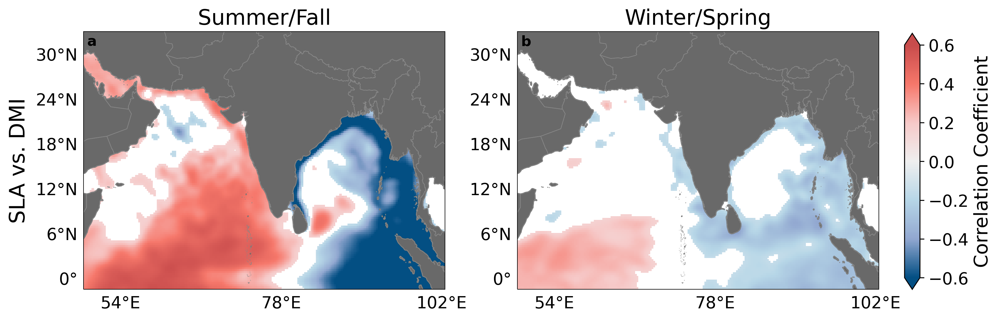

In [7]:
            
# Plot

fig = plt.figure(figsize=(12,4),dpi=300)
sz = 5

cmin_corr = -0.6
cmax_corr = 0.6

cmap = get_continuous_cmap(['#000000','#7A378B','#42d4f4','#D3D3D3','#DcDcDc','#F0F0F0'],
                           [0,0.4,0.6,0.8,0.9,1])

cmap2 = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])

params = {'legend.fontsize': 14,
         'axes.labelsize': 16,
         'axes.titlesize': 18,
         'xtick.labelsize':14,
         'ytick.labelsize':14}
pylab.rcParams.update(params)

##############################################################

ax = fig.add_subplot(121,projection= ccrs.PlateCarree())
tmp = R_VALUE_sla_dmi[:,:,1].flatten()
hatch_var = P_VALUE_sla_dmi[:,:,1].flatten()
hatch_mask = hatch_var <= 0.5
p = ax.scatter(xx[hatch_var <= 0.05],yy[hatch_var <= 0.05],c = tmp[hatch_var <= 0.05],marker='s',s= sz,linewidth=0,
               cmap=cmap2,transform=ccrs.PlateCarree(),vmin=cmin_corr,vmax=cmax_corr)
#                norm=mpl.colors.SymLogNorm(linthresh=0.1, linscale=1,vmin=cmin_corr,vmax=cmax_corr))
ax.set_title('Summer/Fall')
ylabel_map(ax,label='SLA vs. DMI')
g = add_land(ax, bounds = cm_bounds, countries = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 14}
g.ylabel_style = {'size': 14}
add_letter(ax, 'a')

ax = fig.add_subplot(122,projection= ccrs.PlateCarree())
tmp = R_VALUE_sla_dmi[:,:,0].flatten()
hatch_var = P_VALUE_sla_dmi[:,:,0].flatten()
hatch_mask = hatch_var <= 0.5
p = ax.scatter(xx[hatch_var <= 0.05],yy[hatch_var <= 0.05],c = tmp[hatch_var <= 0.05],marker='s',s= sz,linewidth=0,
               cmap=cmap2,transform=ccrs.PlateCarree(),vmin=cmin_corr,vmax=cmax_corr)
#               norm=mpl.colors.SymLogNorm(linthresh=0.1, linscale=1,vmin=cmin_corr,vmax=cmax_corr))
g = add_land(ax, bounds = cm_bounds, countries = True)
g.xlocator = mticker.FixedLocator([54,78,102])
g.xlabel_style = {'size': 14}
g.ylabel_style = {'size': 14}
ax.set_title('Winter/Spring')
add_letter(ax, 'b')

add_single_vert_cbar(fig,p,'Correlation Coefficient', extend = 'both')
plt.savefig(figpath + 'Fig_S4_sla_dmi_corr_map.pdf', format='pdf', dpi = 400)

# S5 - Empirical Cumulative Distribution Function for 50-225

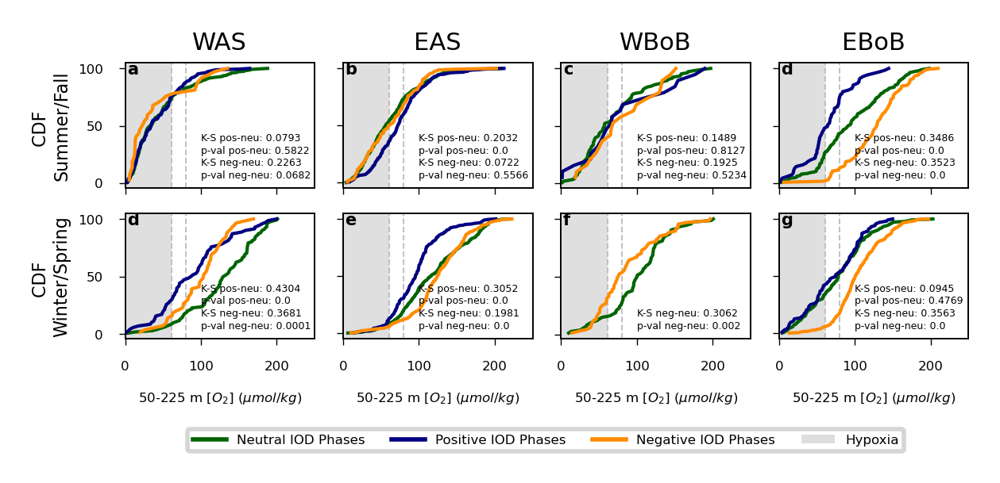

In [8]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

depth = '50_225'
Depth = '50-225'
############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wAS,_,_,sposIODtime_wAS,sposIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# strong positive IOD years -------------------------------------------# 
sposIODdata_eAS,_,_,_,sposIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wBoB,_,_,_,sposIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_eBoB,_,_,_,sposIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')


# Make Histograms 
# hatch_mask = min_mean > hyp_thresh
x = [1,2,3,4]

fig = plt.figure(figsize=(8.7 / 2.54, 1.5), dpi=400)

params = {'legend.fontsize': 3,
         'axes.labelsize': 3.5,
         'axes.titlesize': 5.5,
         'xtick.labelsize':3,
         'ytick.labelsize':3,
         'axes.linewidth':0.35,
         'xtick.major.width':0.25,
         'xtick.major.size':1.5,
         'ytick.major.width':0.25,
         'ytick.major.size':1.5}

pylab.rcParams.update(params)

text_fz = 4.5
sq_sz = 20
lfz = 3.75
width = 0.2
lw = 0.75

clrs = ['darkgreen','navy','darkorange','darkorchid', 'darkgreen']
labels = ['Neutral IOD Phases','Positive IOD Phases','Negative IOD Phases','Strong Positive Phases']
letters = ['a','b','c','d','e','f','g','h']


regions = ['WAS','EAS','WBoB','EBoB']

####################################################################################################

data_wAS = [neuIODdata_wAS,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
data_eAS = [neuIODdata_eAS,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
data_wBoB = [neuIODdata_wBoB,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
data_eBoB = [neuIODdata_eBoB,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

time_data_wAS = [neuIODmon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
time_data_eAS = [neuIODmon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
time_data_wBoB = [neuIODmon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
time_data_eBoB = [neuIODmon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]


cnt = 1
for pp in range(4):

    if pp==0:
        sdata = data_wAS[0]
        pdata = data_wAS[1]
        ndata = data_wAS[2]
        spdata = data_wAS[3]
        
        stdata = time_data_wAS[0]
        ptdata = time_data_wAS[1]
        ntdata = time_data_wAS[2]
        sptdata = time_data_wAS[3]

    elif pp==1:
        sdata = data_eAS[0]
        pdata = data_eAS[1]
        ndata = data_eAS[2]
        spdata = data_eAS[3]
        
        stdata = time_data_eAS[0]
        ptdata = time_data_eAS[1]
        ntdata = time_data_eAS[2]
        sptdata = time_data_eAS[3]

    elif pp==2:
        sdata = data_wBoB[0]
        pdata = data_wBoB[1]
        ndata = data_wBoB[2]
        spdata = data_wBoB[3]
        
        stdata = time_data_wBoB[0]
        ptdata = time_data_wBoB[1]
        ntdata = time_data_wBoB[2]
        sptdata = time_data_wBoB[3]

    else:
        sdata = data_eBoB[0]
        pdata = data_eBoB[1]
        ndata = data_eBoB[2]
        spdata = data_eBoB[3]
        
        stdata = time_data_eBoB[0]
        ptdata = time_data_eBoB[1]
        ntdata = time_data_eBoB[2]
        sptdata = time_data_eBoB[3]

    # O2
    x1 = sdata[~np.isnan(sdata)]
    x2 = pdata[~np.isnan(pdata)]
    x3 = ndata[~np.isnan(ndata)]
    x4 = spdata[~np.isnan(spdata)]

    x1t = stdata[~np.isnan(sdata)]
    x2t = ptdata[~np.isnan(pdata)]
    x3t = ntdata[~np.isnan(ndata)]
    x4t = sptdata[~np.isnan(spdata)]

    # get seasonal indicies
    ind_sf = (x1t == 6) | (x1t == 7) | (x1t == 8) | (x1t == 9) | (x1t == 10) | (x1t == 11)
    ind_ws = (x1t == 12) | (x1t == 1) | (x1t == 2) | (x1t == 3) | (x1t == 4) | (x1t ==5)

    x1_sf = x1[ind_sf]
    x1_ws = x1[ind_ws]

    ind_sf = (x2t == 6) | (x2t == 7) | (x2t == 8) | (x2t == 9) | (x2t == 10) | (x2t == 11)
    ind_ws = (x2t == 12) | (x2t == 1) | (x2t == 2) | (x2t == 3) | (x2t == 4) | (x2t ==5)

    x2_sf = x2[ind_sf]
    x2_ws = x2[ind_ws]

    ind_sf = (x3t == 6) | (x3t == 7) | (x3t == 8) | (x3t == 9) | (x3t == 10) | (x3t == 11)
    ind_ws = (x3t == 12) | (x3t == 1) | (x3t == 2) | (x3t == 3) | (x3t == 4) | (x3t ==5)

    x3_sf = x3[ind_sf]
    x3_ws = x3[ind_ws]
    
    ind_sf = (x4t == 6) | (x4t == 7) | (x4t == 8) | (x4t == 9) | (x4t == 10) | (x4t == 11)
    ind_ws = (x4t == 12) | (x4t == 1) | (x4t == 2) | (x4t == 3) | (x4t == 4) | (x4t ==5)

    x4_sf = x4[ind_sf]
    x4_ws = x4[ind_ws]

    
    # sort
    x1_sf = np.sort(x1_sf)
    x2_sf = np.sort(x2_sf)
    x3_sf = np.sort(x3_sf)
    x4_sf = np.sort(x4_sf)
    
    x1_ws = np.sort(x1_ws)
    x2_ws = np.sort(x2_ws)
    x3_ws = np.sort(x3_ws)
    x4_ws = np.sort(x4_ws)
    
    # ks test
    if (len(x1_sf)>0) & (len(x2_sf)>0):
        pos_all_ks_sf = stats.ks_2samp(x1_sf,x2_sf)
    if (len(x1_sf)>0) & (len(x3_sf)>0):    
        neg_all_ks_sf = stats.ks_2samp(x1_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x3_sf)>0):
        pos_neg_ks_sf = stats.ks_2samp(x2_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x4_sf)>0):
        pos_spos_ks_sf = stats.ks_2samp(x2_sf,x4_sf)

    if (len(x1_ws)>0) & (len(x2_ws)>0):
        pos_all_ks_ws = stats.ks_2samp(x1_ws,x2_ws)
    if (len(x1_ws)>0) & (len(x3_ws)>0):
        neg_all_ks_ws = stats.ks_2samp(x1_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x3_ws)>0):
        pos_neg_ks_ws = stats.ks_2samp(x2_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x4_ws)>0):
        pos_spos_ks_ws = stats.ks_2samp(x2_ws,x4_ws)

    # summer/fall --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
    
    # seasonal 
    tmp = np.sort(x1_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[0])
    
    # positive IOD
    tmp = np.sort(x2_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[1])
    
    # negative IOD
    tmp = np.sort(x3_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[2])
    
    if cnt == 1:
        ax.set_ylabel('CDF \nSummer/Fall', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
        
    ax.set_title(regions[pp], pad = 3)
    ax.set_xticklabels([])
        
    ax.set_xlim([0,250])
    add_letter(ax, letters[cnt-1], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x1_sf)>1) & (len(x2_sf)>1):
        add_text(ax, 'K-S pos-neu: ' + str(np.round(pos_all_ks_sf[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-neu: ' + str(np.round(pos_all_ks_sf[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        
    if (len(x1_sf)>1) & (len(x3_sf)>1):
        add_text(ax, 'K-S neg-neu: ' + str(np.round(neg_all_ks_sf[0],4)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'p-val neg-neu: ' + str(np.round(neg_all_ks_sf[1],4)), x = 0.4,y=0.08, fontsize = 2.25)
        

    

    # winter/spring --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt + 4)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', label = 'Hypoxia', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)

    # seasonal 
    tmp = np.sort(x1_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[0], label = labels[0])

    # positive IOD
    tmp = np.sort(x2_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[1], label = labels[1])
    
    # negative IOD
    tmp = np.sort(x3_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[2], label = labels[2])
    
    
    ax.set_xlim([0,250])
    if cnt == 1:
        ax.set_ylabel('CDF \nWinter/Spring', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
    ax.set_xlabel(Depth + ' m [$O_2$] ($\mu mol/ kg$)', fontsize = 3)
    add_letter(ax, letters[cnt+2], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x1_ws)>1) & (len(x2_ws)>1):
        add_text(ax, 'K-S pos-neu: ' + str(np.round(pos_all_ks_ws[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-neu: ' + str(np.round(pos_all_ks_ws[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        
    if (len(x1_ws)>1) & (len(x3_ws)>1):
        add_text(ax, 'K-S neg-neu: ' + str(np.round(neg_all_ks_ws[0],4)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'p-val neg-neu: ' + str(np.round(neg_all_ks_ws[1],4)), x = 0.4,y=0.08, fontsize = 2.25)
        
    cnt += 1

leg = ax.legend(loc='lower center', bbox_to_anchor=(-1.23, -.95),
          ncol=5, handlelength = 2.5)

for line in leg.get_lines():
    line.set_linewidth(1.0)

plt.subplots_adjust(wspace = 0.15, bottom = 0.3)

plt.savefig(figpath + 'Fig_S5_cdfs_' + depth + '.pdf', format='pdf', dpi = 400)



# S6 - sposiod edf 50-225m

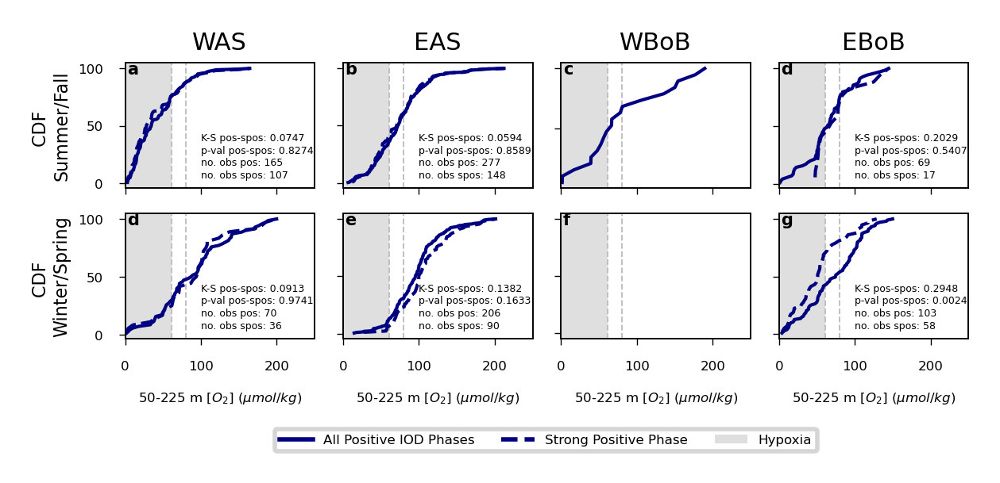

In [9]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

depth = '50_225'
Depth = '50-225'
############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wAS,_,_,sposIODtime_wAS,sposIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# strong positive IOD years -------------------------------------------# 
sposIODdata_eAS,_,_,_,sposIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wBoB,_,_,_,sposIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_eBoB,_,_,_,sposIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')

# Make Histograms 
# hatch_mask = min_mean > hyp_thresh
x = [1,2,3,4]

fig = plt.figure(figsize=(8.7 / 2.54, 1.5), dpi=400)

params = {'legend.fontsize': 3,
         'axes.labelsize': 3.5,
         'axes.titlesize': 5.5,
         'xtick.labelsize':3,
         'ytick.labelsize':3,
         'axes.linewidth':0.35,
         'xtick.major.width':0.25,
         'xtick.major.size':1.5,
         'ytick.major.width':0.25,
         'ytick.major.size':1.5}

pylab.rcParams.update(params)

text_fz = 4.5
sq_sz = 20
lfz = 3.75
width = 0.2
lw = 0.75

# clrs = ['darkgreen','darkorange','navy','darkorchid', 'darkgreen']
clrs = ['darkgreen','navy','darkorange','darkorchid', 'darkgreen']
labels = ['Positive IOD Phases','Strong Positive Phases']
letters = ['a','b','c','d','e','f','g','h']


regions = ['WAS','EAS','WBoB','EBoB']

####################################################################################################

data_wAS = [neuIODdata_wAS,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
data_eAS = [neuIODdata_eAS,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
data_wBoB = [neuIODdata_wBoB,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
data_eBoB = [neuIODdata_eBoB,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

time_data_wAS = [neuIODmon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
time_data_eAS = [neuIODmon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
time_data_wBoB = [neuIODmon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
time_data_eBoB = [neuIODmon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]



cnt = 1
for pp in range(4):

    if pp==0:
        sdata = data_wAS[0]
        pdata = data_wAS[1]
        ndata = data_wAS[2]
        spdata = data_wAS[3]
        
        stdata = time_data_wAS[0]
        ptdata = time_data_wAS[1]
        ntdata = time_data_wAS[2]
        sptdata = time_data_wAS[3]

    elif pp==1:
        sdata = data_eAS[0]
        pdata = data_eAS[1]
        ndata = data_eAS[2]
        spdata = data_eAS[3]
        
        stdata = time_data_eAS[0]
        ptdata = time_data_eAS[1]
        ntdata = time_data_eAS[2]
        sptdata = time_data_eAS[3]

    elif pp==2:
        sdata = data_wBoB[0]
        pdata = data_wBoB[1]
        ndata = data_wBoB[2]
        spdata = data_wBoB[3]
        
        stdata = time_data_wBoB[0]
        ptdata = time_data_wBoB[1]
        ntdata = time_data_wBoB[2]
        sptdata = time_data_wBoB[3]

    else:
        sdata = data_eBoB[0]
        pdata = data_eBoB[1]
        ndata = data_eBoB[2]
        spdata = data_eBoB[3]
        
        stdata = time_data_eBoB[0]
        ptdata = time_data_eBoB[1]
        ntdata = time_data_eBoB[2]
        sptdata = time_data_eBoB[3]

    # O2
    x1 = sdata[~np.isnan(sdata)]
    x2 = pdata[~np.isnan(pdata)]
    x3 = ndata[~np.isnan(ndata)]
    x4 = spdata[~np.isnan(spdata)]

    x1t = stdata[~np.isnan(sdata)]
    x2t = ptdata[~np.isnan(pdata)]
    x3t = ntdata[~np.isnan(ndata)]
    x4t = sptdata[~np.isnan(spdata)]

    # get seasonal indicies
    ind_sf = (x1t == 6) | (x1t == 7) | (x1t == 8) | (x1t == 9) | (x1t == 10) | (x1t == 11)
    ind_ws = (x1t == 12) | (x1t == 1) | (x1t == 2) | (x1t == 3) | (x1t == 4) | (x1t ==5)

    x1_sf = x1[ind_sf]
    x1_ws = x1[ind_ws]

    ind_sf = (x2t == 6) | (x2t == 7) | (x2t == 8) | (x2t == 9) | (x2t == 10) | (x2t == 11)
    ind_ws = (x2t == 12) | (x2t == 1) | (x2t == 2) | (x2t == 3) | (x2t == 4) | (x2t ==5)

    x2_sf = x2[ind_sf]
    x2_ws = x2[ind_ws]

    ind_sf = (x3t == 6) | (x3t == 7) | (x3t == 8) | (x3t == 9) | (x3t == 10) | (x3t == 11)
    ind_ws = (x3t == 12) | (x3t == 1) | (x3t == 2) | (x3t == 3) | (x3t == 4) | (x3t ==5)

    x3_sf = x3[ind_sf]
    x3_ws = x3[ind_ws]
    
    ind_sf = (x4t == 6) | (x4t == 7) | (x4t == 8) | (x4t == 9) | (x4t == 10) | (x4t == 11)
    ind_ws = (x4t == 12) | (x4t == 1) | (x4t == 2) | (x4t == 3) | (x4t == 4) | (x4t ==5)

    x4_sf = x4[ind_sf]
    x4_ws = x4[ind_ws]

    
    # sort
    x1_sf = np.sort(x1_sf)
    x2_sf = np.sort(x2_sf)
    x3_sf = np.sort(x3_sf)
    x4_sf = np.sort(x4_sf)
    
    x1_ws = np.sort(x1_ws)
    x2_ws = np.sort(x2_ws)
    x3_ws = np.sort(x3_ws)
    x4_ws = np.sort(x4_ws)
    
    # ks test
    if (len(x1_sf)>0) & (len(x2_sf)>0):
        pos_all_ks_sf = stats.ks_2samp(x1_sf,x2_sf)
    if (len(x1_sf)>0) & (len(x3_sf)>0):    
        neg_all_ks_sf = stats.ks_2samp(x1_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x3_sf)>0):
        pos_neg_ks_sf = stats.ks_2samp(x2_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x4_sf)>0):
        pos_spos_ks_sf = stats.ks_2samp(x2_sf,x4_sf)

    if (len(x1_ws)>0) & (len(x2_ws)>0):
        pos_all_ks_ws = stats.ks_2samp(x1_ws,x2_ws)
    if (len(x1_ws)>0) & (len(x3_ws)>0):
        neg_all_ks_ws = stats.ks_2samp(x1_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x3_ws)>0):
        pos_neg_ks_ws = stats.ks_2samp(x2_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x4_ws)>0):
        pos_spos_ks_ws = stats.ks_2samp(x2_ws,x4_ws)

    # summer/fall --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
    
   
    # positive IOD
    tmp = np.sort(x2_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[1])
    
    # strong positive IOD 
    tmp = np.sort(x4_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[1], linestyle = '--')

    
    if cnt == 1:
        ax.set_ylabel('CDF \nSummer/Fall', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
        
    ax.set_title(regions[pp], pad = 3)
    ax.set_xticklabels([])
        
    ax.set_xlim([0,250])
    add_letter(ax, letters[cnt-1], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x2_sf)>1) & (len(x4_sf)>1):
        add_text(ax, 'K-S pos-spos: ' + str(np.round(pos_spos_ks_sf[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-spos: ' + str(np.round(pos_spos_ks_sf[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        add_text(ax, 'no. obs pos: ' + str(len(x2_sf)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'no. obs spos: ' + str(len(x4_sf)), x = 0.4,y=0.08, fontsize = 2.25)

    

    # winter/spring --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt + 4)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', label = 'Hypoxia', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)

    # positive IOD
    tmp = np.sort(x2_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[1], label = 'All Positive IOD Phases')
   
    # strong positive IOD 
    tmp = np.sort(x4_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[1], linestyle = '--',label = 'Strong Positive Phase')
    
    ax.set_xlim([0,250])
    if cnt == 1:
        ax.set_ylabel('CDF \nWinter/Spring', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
    ax.set_xlabel(Depth + ' m [$O_2$] ($\mu mol/ kg$)', fontsize = 3)
    add_letter(ax, letters[cnt+2], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x2_ws)>1) & (len(x4_ws)>1):
        add_text(ax, 'K-S pos-spos: ' + str(np.round(pos_spos_ks_ws[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-spos: ' + str(np.round(pos_spos_ks_ws[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        add_text(ax, 'no. obs pos: ' + str(len(x2_ws)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'no. obs spos: ' + str(len(x4_ws)), x = 0.4,y=0.08, fontsize = 2.25)

    cnt += 1

leg = ax.legend(loc='lower center', bbox_to_anchor=(-1.23, -.95),
          ncol=5, handlelength = 2.5)

for line in leg.get_lines():
    line.set_linewidth(1.0)

plt.subplots_adjust(wspace = 0.15, bottom = 0.3)

plt.savefig(figpath + 'Fig_S6_cdfs_sposiods_' + depth + '.pdf', format='pdf', dpi = 400)




# S7 - PDFs 50-225m

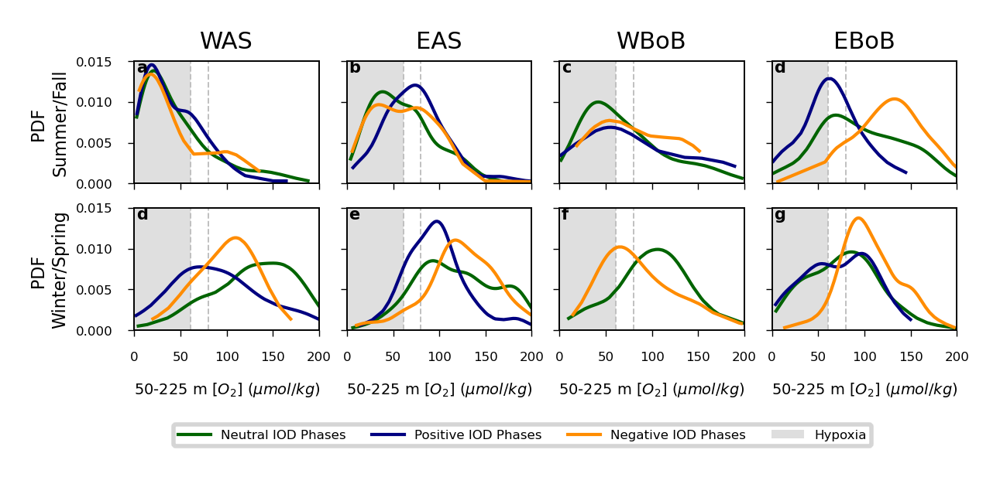

In [10]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

depth = '50_225'
Depth = '50-225'
############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wAS,_,_,sposIODtime_wAS,sposIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# strong positive IOD years -------------------------------------------# 
sposIODdata_eAS,_,_,_,sposIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wBoB,_,_,_,sposIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_eBoB,_,_,_,sposIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')

# Make Histograms 
# hatch_mask = min_mean > hyp_thresh
x = [1,2,3,4]

fig = plt.figure(figsize=(8.7 / 2.54, 1.5), dpi=400)

params = {'legend.fontsize': 3,
         'axes.labelsize': 3.5,
         'axes.titlesize': 5.5,
         'xtick.labelsize':3,
         'ytick.labelsize':3,
         'axes.linewidth':0.35,
         'xtick.major.width':0.25,
         'xtick.major.size':1.5,
         'ytick.major.width':0.25,
         'ytick.major.size':1.5}
pylab.rcParams.update(params)

text_fz = 4.5
sq_sz = 20
lfz = 3.75
width = 0.2
lw = 0.75

# clrs = ['darkgreen','darkorange','navy','darkorchid', 'darkgreen']
clrs = ['darkgreen','navy','darkorange','darkorchid', 'darkgreen']
labels = ['Neutral IOD Phases','Positive IOD Phases','Negative IOD Phases','Hypoxia']
letters = ['a','b','c','d','e','f','g','h']

regions = ['WAS','EAS','WBoB','EBoB']

####################################################################################################

data_wAS = [neuIODdata_wAS,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
data_eAS = [neuIODdata_eAS,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
data_wBoB = [neuIODdata_wBoB,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
data_eBoB = [neuIODdata_eBoB,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

time_data_wAS = [neuIODmon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
time_data_eAS = [neuIODmon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
time_data_wBoB = [neuIODmon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
time_data_eBoB = [neuIODmon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]

cnt = 1
for pp in range(4):

    if pp==0:
        sdata = data_wAS[0]
        pdata = data_wAS[1]
        ndata = data_wAS[2]
        spdata = data_wAS[3]
        
        stdata = time_data_wAS[0]
        ptdata = time_data_wAS[1]
        ntdata = time_data_wAS[2]
        sptdata = time_data_wAS[3]

    elif pp==1:
        sdata = data_eAS[0]
        pdata = data_eAS[1]
        ndata = data_eAS[2]
        spdata = data_eAS[3]
        
        stdata = time_data_eAS[0]
        ptdata = time_data_eAS[1]
        ntdata = time_data_eAS[2]
        sptdata = time_data_eAS[3]

    elif pp==2:
        sdata = data_wBoB[0]
        pdata = data_wBoB[1]
        ndata = data_wBoB[2]
        spdata = data_wBoB[3]
        
        stdata = time_data_wBoB[0]
        ptdata = time_data_wBoB[1]
        ntdata = time_data_wBoB[2]
        sptdata = time_data_wBoB[3]

    else:
        sdata = data_eBoB[0]
        pdata = data_eBoB[1]
        ndata = data_eBoB[2]
        spdata = data_eBoB[3]
        
        stdata = time_data_eBoB[0]
        ptdata = time_data_eBoB[1]
        ntdata = time_data_eBoB[2]
        sptdata = time_data_eBoB[3]

    # O2
    x1 = sdata[~np.isnan(sdata)]
    x2 = pdata[~np.isnan(pdata)]
    x3 = ndata[~np.isnan(ndata)]
    x4 = spdata[~np.isnan(spdata)]

    x1t = stdata[~np.isnan(sdata)]
    x2t = ptdata[~np.isnan(pdata)]
    x3t = ntdata[~np.isnan(ndata)]
    x4t = sptdata[~np.isnan(spdata)]

    # get seasonal indicies
    ind_sf = (x1t == 6) | (x1t == 7) | (x1t == 8) | (x1t == 9) | (x1t == 10) | (x1t == 11)
    ind_ws = (x1t == 12) | (x1t == 1) | (x1t == 2) | (x1t == 3) | (x1t == 4) | (x1t ==5)

    x1_sf = x1[ind_sf]
    x1_ws = x1[ind_ws]

    ind_sf = (x2t == 6) | (x2t == 7) | (x2t == 8) | (x2t == 9) | (x2t == 10) | (x2t == 11)
    ind_ws = (x2t == 12) | (x2t == 1) | (x2t == 2) | (x2t == 3) | (x2t == 4) | (x2t ==5)

    x2_sf = x2[ind_sf]
    x2_ws = x2[ind_ws]

    ind_sf = (x3t == 6) | (x3t == 7) | (x3t == 8) | (x3t == 9) | (x3t == 10) | (x3t == 11)
    ind_ws = (x3t == 12) | (x3t == 1) | (x3t == 2) | (x3t == 3) | (x3t == 4) | (x3t ==5)

    x3_sf = x3[ind_sf]
    x3_ws = x3[ind_ws]
    
    ind_sf = (x4t == 6) | (x4t == 7) | (x4t == 8) | (x4t == 9) | (x4t == 10) | (x4t == 11)
    ind_ws = (x4t == 12) | (x4t == 1) | (x4t == 2) | (x4t == 3) | (x4t == 4) | (x4t ==5)

    x4_sf = x4[ind_sf]
    x4_ws = x4[ind_ws]

    # summer/fall --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
    
    
    # seasonal 
    tmp = np.sort(x1_sf)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[0])
    
    # positive IOD
    tmp = np.sort(x2_sf)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[1])
    
    # negative IOD
    tmp = np.sort(x3_sf)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[2])

    
    if cnt == 1:
        ax.set_ylabel('PDF \nSummer/Fall', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
        
    ax.set_title(regions[pp], pad = 3)
    ax.set_xticklabels([])
        
    ax.set_xlim([0,200])
    ax.set_ylim([0,0.015])
    add_letter(ax, letters[cnt-1], x = 0.01,y=0.91, fontsize = lfz)

    # winter/spring --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt + 4)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', linewidth = 0,label = labels[3])
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)

        # seasonal 
    tmp = np.sort(x1_ws)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[0], label = labels[0])
    
    # positive IOD
    tmp = np.sort(x2_ws)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[1], label = labels[1])
    
    # negative IOD
    tmp = np.sort(x3_ws)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[2], label = labels[2])
    
#     # strong positive IOD 
#     tmp = np.sort(x4_ws)
#     if len(tmp)>1:
#         kernel = stats.gaussian_kde(tmp)
#         plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[1], linestyle = '--')
        
    ax.set_xlim([0,200])
    ax.set_ylim([0,0.015])
    if cnt == 1:
        ax.set_ylabel('PDF \nWinter/Spring', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
    ax.set_xlabel(Depth + ' m [$O_2$] ($\mu mol/ kg$)')
    add_letter(ax, letters[cnt+2], x = 0.01,y=0.91, fontsize = lfz)
    
    cnt += 1

ax.legend(loc='lower center', bbox_to_anchor=(-1.35, -1),
          ncol=5, handlelength = 2.5)

plt.subplots_adjust(wspace = 0.15, bottom = 0.3)

plt.savefig(figpath + 'Fig_S7_pdfs_'+depth+'.pdf', format='pdf', dpi = 400)



# S8 - SLA Correlations 50-225m

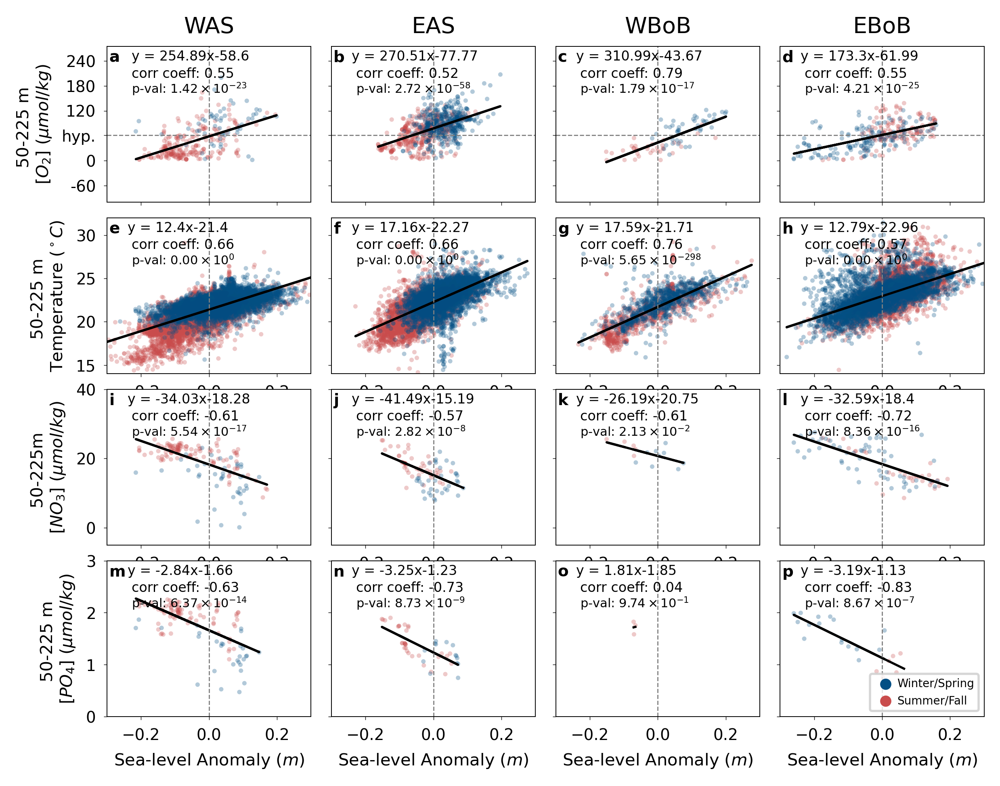

In [11]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# SLA
ds_SLA = xr.open_dataset('../data_processing/6_Regridding/sla_to_wod.nc')

depth = '50_225'
Depth = '50-225'
############################################################################
doxy_wAS = ds_WOD['doxy_wAS_' + depth]
doxy_eAS = ds_WOD['doxy_eAS_' + depth]
doxy_wBoB = ds_WOD['doxy_wBoB_' + depth]
doxy_eBoB = ds_WOD['doxy_eBoB_' + depth]

sla_wAS = ds_SLA['sla_wAS']
sla_eAS = ds_SLA['sla_eAS']
sla_wBoB = ds_SLA['sla_wBoB']
sla_eBoB = ds_SLA['sla_eBoB']

seas_wAS = ds_WOD['seas_wAS']
seas_eAS = ds_WOD['seas_eAS']
seas_wBoB = ds_WOD['seas_wBoB']
seas_eBoB = ds_WOD['seas_eBoB']

temp_wAS = ds_WOD['temp_wAS_' + depth]
temp_eAS = ds_WOD['temp_eAS_' + depth]
temp_wBoB = ds_WOD['temp_wBoB_' + depth]
temp_eBoB = ds_WOD['temp_eBoB_' + depth]

nitrate_wAS = ds_WOD['nitrate_wAS_' + depth]
nitrate_eAS = ds_WOD['nitrate_eAS_' + depth]
nitrate_wBoB = ds_WOD['nitrate_wBoB_' + depth]
nitrate_eBoB = ds_WOD['nitrate_eBoB_' + depth]

phosphate_wAS = ds_WOD['phosphate_wAS_' + depth]
phosphate_eAS = ds_WOD['phosphate_eAS_' + depth]
phosphate_wBoB = ds_WOD['phosphate_wBoB_' + depth]
phosphate_eBoB = ds_WOD['phosphate_eBoB_' + depth]
##############################################################
fig = plt.figure(figsize=(17.8 / 2.54,5.5),dpi=400)


regions = ['WAS','EAS','WBoB','EBoB']
sz = 4
fsz = 6
lfz = 7
lw = 1
alpha = .3


xlim = [-0.3,0.3]
ylim = [-100,275]

cmap = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
s_clr = '#c94c4c'
w_clr = '#034f84'
piod_clr = 'darkgreen'
niod_clr = 'purple'

params = {'legend.fontsize': 5,
         'axes.labelsize': 7.5,
         'axes.titlesize': 10,
         'xtick.labelsize':7,
         'ytick.labelsize':7}

pylab.rcParams.update(params)

##############################################################

ax = fig.add_subplot(441)
var1 = sla_wAS
var2 = doxy_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.set_title(regions[0])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xticklabels([])
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_ylabel(Depth + ' m \n[$O_2$] ($\mu mol/ kg$)')
add_letter(ax, 'a', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.12,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(442)
var1 = sla_eAS
var2 = doxy_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.set_title(regions[1])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xticklabels([])
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])

add_letter(ax, 'b', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(443)
var1 = sla_wBoB
var2 = doxy_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.set_title(regions[2])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xticklabels([])
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'c', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(444)
var1 = sla_eBoB
var2 = doxy_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.set_title(regions[3])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xticklabels([])
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'd', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


#####################################################################
ylim = [14,32]

ax = fig.add_subplot(445)
var1 = sla_wAS
var2 = temp_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_ylabel(Depth + ' m \nTemperature ($^\circ C$)')
add_letter(ax, 'e', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)



ax = fig.add_subplot(446)
var1 = sla_eAS
var2 = temp_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'f', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


ax = fig.add_subplot(447)
var1 = sla_wBoB
var2 = temp_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'g', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(448)
var1 = sla_eBoB
var2 = temp_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'h', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

#####################################################################
ylim = [-5,40]

ax = fig.add_subplot(449)
var1 = sla_wAS
var2 = nitrate_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_ylabel(Depth + 'm \n[$NO_3$] ($\mu mol/ kg$)')
add_letter(ax, 'i', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)



ax = fig.add_subplot(4,4,10)
var1 = sla_eAS
var2 = nitrate_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'j', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


ax = fig.add_subplot(4,4,11)
var1 = sla_wBoB
var2 = nitrate_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'k', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(4,4,12)
var1 = sla_eBoB
var2 = nitrate_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'l', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)



#####################################################################
ylim = [0,3]

ax = fig.add_subplot(4,4,13)
var1 = sla_wAS
var2 = phosphate_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_ylabel(Depth + ' m \n[$PO_4$] ($\mu mol/ kg$)')
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'm', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)



ax = fig.add_subplot(4,4,14)
var1 = sla_eAS
var2 = phosphate_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'n', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


ax = fig.add_subplot(4,4,15)
var1 = sla_wBoB
var2 = phosphate_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'o', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(4,4,16)
var1 = sla_eBoB
var2 = phosphate_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'p', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


ax.scatter(np.nan,np.nan,c = w_clr, s= sz, edgecolor = 'none', label = 'Winter/Spring')
ax.scatter(np.nan,np.nan,c = s_clr, s= sz, edgecolor = 'none', label = 'Summer/Fall')
# ax.axhline(y = -1,color = 'gray',linestyle = '--', linewidth = 0.5, label = 'hypoxia')
plt.legend(loc = 'lower right', handletextpad = 0.001, markerscale = 2.5)

plt.subplots_adjust(wspace = 0.1,hspace = 0.1)

plt.savefig(figpath + 'Fig_S8_sla_corr_o2_temp_nit_phos_' + depth + '.pdf', format='pdf', dpi = 400)



# S9 - Empirical Cumulative Distribution Function for 40-200m

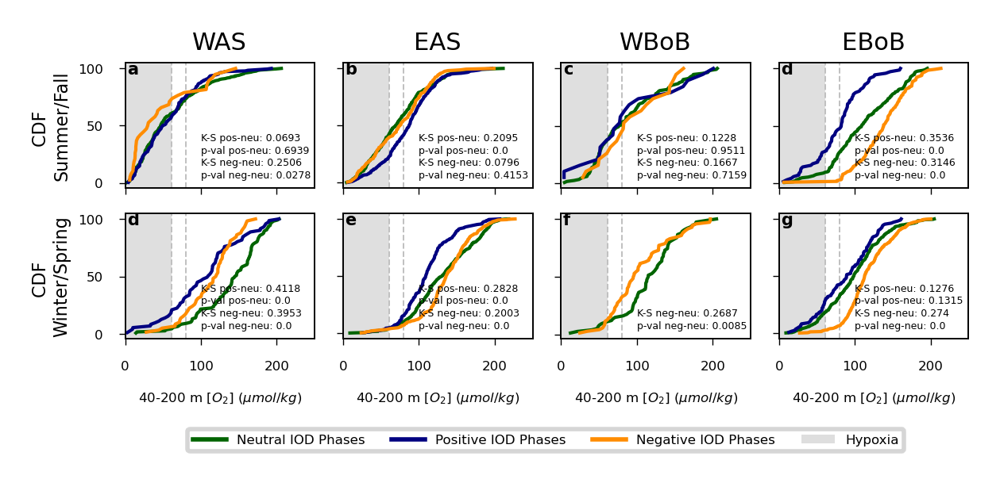

In [12]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

depth = '40_200'
Depth = '40-200'
############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wAS,_,_,sposIODtime_wAS,sposIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# strong positive IOD years -------------------------------------------# 
sposIODdata_eAS,_,_,_,sposIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wBoB,_,_,_,sposIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_eBoB,_,_,_,sposIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')


# Make Histograms 
# hatch_mask = min_mean > hyp_thresh
x = [1,2,3,4]

fig = plt.figure(figsize=(8.7 / 2.54, 1.5), dpi=400)

params = {'legend.fontsize': 3,
         'axes.labelsize': 3.5,
         'axes.titlesize': 5.5,
         'xtick.labelsize':3,
         'ytick.labelsize':3,
         'axes.linewidth':0.35,
         'xtick.major.width':0.25,
         'xtick.major.size':1.5,
         'ytick.major.width':0.25,
         'ytick.major.size':1.5}

pylab.rcParams.update(params)

text_fz = 4.5
sq_sz = 20
lfz = 3.75
width = 0.2
lw = 0.75

clrs = ['darkgreen','navy','darkorange','darkorchid', 'darkgreen']
labels = ['Neutral IOD Phases','Positive IOD Phases','Negative IOD Phases','Strong Positive Phases']
letters = ['a','b','c','d','e','f','g','h']


regions = ['WAS','EAS','WBoB','EBoB']

####################################################################################################

data_wAS = [neuIODdata_wAS,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
data_eAS = [neuIODdata_eAS,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
data_wBoB = [neuIODdata_wBoB,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
data_eBoB = [neuIODdata_eBoB,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

time_data_wAS = [neuIODmon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
time_data_eAS = [neuIODmon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
time_data_wBoB = [neuIODmon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
time_data_eBoB = [neuIODmon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]


cnt = 1
for pp in range(4):

    if pp==0:
        sdata = data_wAS[0]
        pdata = data_wAS[1]
        ndata = data_wAS[2]
        spdata = data_wAS[3]
        
        stdata = time_data_wAS[0]
        ptdata = time_data_wAS[1]
        ntdata = time_data_wAS[2]
        sptdata = time_data_wAS[3]

    elif pp==1:
        sdata = data_eAS[0]
        pdata = data_eAS[1]
        ndata = data_eAS[2]
        spdata = data_eAS[3]
        
        stdata = time_data_eAS[0]
        ptdata = time_data_eAS[1]
        ntdata = time_data_eAS[2]
        sptdata = time_data_eAS[3]

    elif pp==2:
        sdata = data_wBoB[0]
        pdata = data_wBoB[1]
        ndata = data_wBoB[2]
        spdata = data_wBoB[3]
        
        stdata = time_data_wBoB[0]
        ptdata = time_data_wBoB[1]
        ntdata = time_data_wBoB[2]
        sptdata = time_data_wBoB[3]

    else:
        sdata = data_eBoB[0]
        pdata = data_eBoB[1]
        ndata = data_eBoB[2]
        spdata = data_eBoB[3]
        
        stdata = time_data_eBoB[0]
        ptdata = time_data_eBoB[1]
        ntdata = time_data_eBoB[2]
        sptdata = time_data_eBoB[3]

    # O2
    x1 = sdata[~np.isnan(sdata)]
    x2 = pdata[~np.isnan(pdata)]
    x3 = ndata[~np.isnan(ndata)]
    x4 = spdata[~np.isnan(spdata)]

    x1t = stdata[~np.isnan(sdata)]
    x2t = ptdata[~np.isnan(pdata)]
    x3t = ntdata[~np.isnan(ndata)]
    x4t = sptdata[~np.isnan(spdata)]

    # get seasonal indicies
    ind_sf = (x1t == 6) | (x1t == 7) | (x1t == 8) | (x1t == 9) | (x1t == 10) | (x1t == 11)
    ind_ws = (x1t == 12) | (x1t == 1) | (x1t == 2) | (x1t == 3) | (x1t == 4) | (x1t ==5)

    x1_sf = x1[ind_sf]
    x1_ws = x1[ind_ws]

    ind_sf = (x2t == 6) | (x2t == 7) | (x2t == 8) | (x2t == 9) | (x2t == 10) | (x2t == 11)
    ind_ws = (x2t == 12) | (x2t == 1) | (x2t == 2) | (x2t == 3) | (x2t == 4) | (x2t ==5)

    x2_sf = x2[ind_sf]
    x2_ws = x2[ind_ws]

    ind_sf = (x3t == 6) | (x3t == 7) | (x3t == 8) | (x3t == 9) | (x3t == 10) | (x3t == 11)
    ind_ws = (x3t == 12) | (x3t == 1) | (x3t == 2) | (x3t == 3) | (x3t == 4) | (x3t ==5)

    x3_sf = x3[ind_sf]
    x3_ws = x3[ind_ws]
    
    ind_sf = (x4t == 6) | (x4t == 7) | (x4t == 8) | (x4t == 9) | (x4t == 10) | (x4t == 11)
    ind_ws = (x4t == 12) | (x4t == 1) | (x4t == 2) | (x4t == 3) | (x4t == 4) | (x4t ==5)

    x4_sf = x4[ind_sf]
    x4_ws = x4[ind_ws]

    
    # sort
    x1_sf = np.sort(x1_sf)
    x2_sf = np.sort(x2_sf)
    x3_sf = np.sort(x3_sf)
    x4_sf = np.sort(x4_sf)
    
    x1_ws = np.sort(x1_ws)
    x2_ws = np.sort(x2_ws)
    x3_ws = np.sort(x3_ws)
    x4_ws = np.sort(x4_ws)
    
    # ks test
    if (len(x1_sf)>0) & (len(x2_sf)>0):
        pos_all_ks_sf = stats.ks_2samp(x1_sf,x2_sf)
    if (len(x1_sf)>0) & (len(x3_sf)>0):    
        neg_all_ks_sf = stats.ks_2samp(x1_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x3_sf)>0):
        pos_neg_ks_sf = stats.ks_2samp(x2_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x4_sf)>0):
        pos_spos_ks_sf = stats.ks_2samp(x2_sf,x4_sf)

    if (len(x1_ws)>0) & (len(x2_ws)>0):
        pos_all_ks_ws = stats.ks_2samp(x1_ws,x2_ws)
    if (len(x1_ws)>0) & (len(x3_ws)>0):
        neg_all_ks_ws = stats.ks_2samp(x1_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x3_ws)>0):
        pos_neg_ks_ws = stats.ks_2samp(x2_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x4_ws)>0):
        pos_spos_ks_ws = stats.ks_2samp(x2_ws,x4_ws)

    # summer/fall --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
    
    # seasonal 
    tmp = np.sort(x1_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[0])
    
    # positive IOD
    tmp = np.sort(x2_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[1])
    
    # negative IOD
    tmp = np.sort(x3_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[2])
    
    if cnt == 1:
        ax.set_ylabel('CDF \nSummer/Fall', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
        
    ax.set_title(regions[pp], pad = 3)
    ax.set_xticklabels([])
        
    ax.set_xlim([0,250])
    add_letter(ax, letters[cnt-1], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x1_sf)>1) & (len(x2_sf)>1):
        add_text(ax, 'K-S pos-neu: ' + str(np.round(pos_all_ks_sf[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-neu: ' + str(np.round(pos_all_ks_sf[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        
    if (len(x1_sf)>1) & (len(x3_sf)>1):
        add_text(ax, 'K-S neg-neu: ' + str(np.round(neg_all_ks_sf[0],4)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'p-val neg-neu: ' + str(np.round(neg_all_ks_sf[1],4)), x = 0.4,y=0.08, fontsize = 2.25)
        

    

    # winter/spring --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt + 4)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', label = 'Hypoxia', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)

    # seasonal 
    tmp = np.sort(x1_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[0], label = labels[0])

    # positive IOD
    tmp = np.sort(x2_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[1], label = labels[1])
    
    # negative IOD
    tmp = np.sort(x3_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[2], label = labels[2])
    
    
    ax.set_xlim([0,250])
    if cnt == 1:
        ax.set_ylabel('CDF \nWinter/Spring', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
    ax.set_xlabel(Depth + ' m [$O_2$] ($\mu mol/ kg$)', fontsize = 3)
    add_letter(ax, letters[cnt+2], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x1_ws)>1) & (len(x2_ws)>1):
        add_text(ax, 'K-S pos-neu: ' + str(np.round(pos_all_ks_ws[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-neu: ' + str(np.round(pos_all_ks_ws[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        
    if (len(x1_ws)>1) & (len(x3_ws)>1):
        add_text(ax, 'K-S neg-neu: ' + str(np.round(neg_all_ks_ws[0],4)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'p-val neg-neu: ' + str(np.round(neg_all_ks_ws[1],4)), x = 0.4,y=0.08, fontsize = 2.25)
        
    cnt += 1

leg = ax.legend(loc='lower center', bbox_to_anchor=(-1.23, -.95),
          ncol=5, handlelength = 2.5)

for line in leg.get_lines():
    line.set_linewidth(1.0)

plt.subplots_adjust(wspace = 0.15, bottom = 0.3)

plt.savefig(figpath + 'Fig_S9_cdfs_' + depth + '.pdf', format='pdf', dpi = 400)




# S10 - edcf sposiod 40-200m

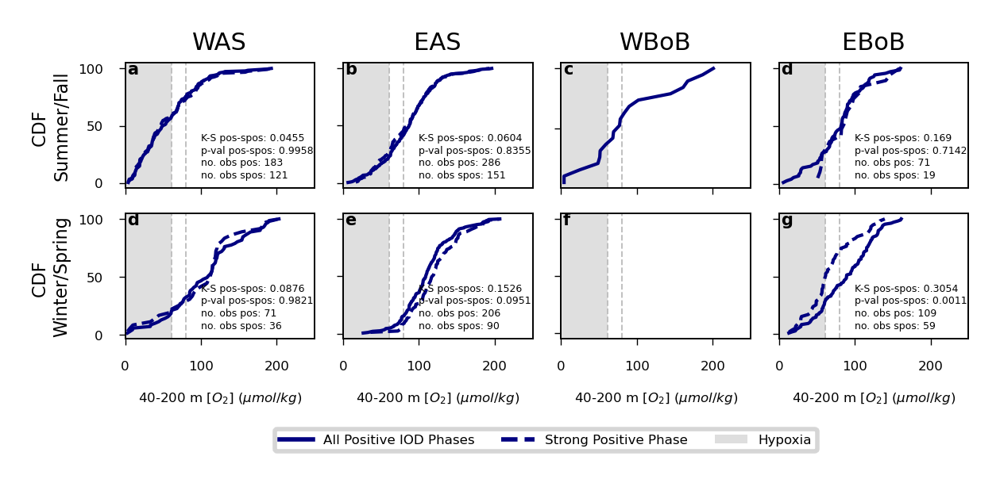

In [13]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

depth = '40_200'
Depth = '40-200'
############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wAS,_,_,sposIODtime_wAS,sposIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# strong positive IOD years -------------------------------------------# 
sposIODdata_eAS,_,_,_,sposIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wBoB,_,_,_,sposIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_eBoB,_,_,_,sposIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')

# Make Histograms 
# hatch_mask = min_mean > hyp_thresh
x = [1,2,3,4]

fig = plt.figure(figsize=(8.7 / 2.54, 1.5), dpi=400)

params = {'legend.fontsize': 3,
         'axes.labelsize': 3.5,
         'axes.titlesize': 5.5,
         'xtick.labelsize':3,
         'ytick.labelsize':3,
         'axes.linewidth':0.35,
         'xtick.major.width':0.25,
         'xtick.major.size':1.5,
         'ytick.major.width':0.25,
         'ytick.major.size':1.5}

pylab.rcParams.update(params)

text_fz = 4.5
sq_sz = 20
lfz = 3.75
width = 0.2
lw = 0.75

# clrs = ['darkgreen','darkorange','navy','darkorchid', 'darkgreen']
clrs = ['darkgreen','navy','darkorange','darkorchid', 'darkgreen']
labels = ['Positive IOD Phases','Strong Positive Phases']
letters = ['a','b','c','d','e','f','g','h']


regions = ['WAS','EAS','WBoB','EBoB']

####################################################################################################

data_wAS = [neuIODdata_wAS,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
data_eAS = [neuIODdata_eAS,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
data_wBoB = [neuIODdata_wBoB,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
data_eBoB = [neuIODdata_eBoB,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

time_data_wAS = [neuIODmon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
time_data_eAS = [neuIODmon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
time_data_wBoB = [neuIODmon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
time_data_eBoB = [neuIODmon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]



cnt = 1
for pp in range(4):

    if pp==0:
        sdata = data_wAS[0]
        pdata = data_wAS[1]
        ndata = data_wAS[2]
        spdata = data_wAS[3]
        
        stdata = time_data_wAS[0]
        ptdata = time_data_wAS[1]
        ntdata = time_data_wAS[2]
        sptdata = time_data_wAS[3]

    elif pp==1:
        sdata = data_eAS[0]
        pdata = data_eAS[1]
        ndata = data_eAS[2]
        spdata = data_eAS[3]
        
        stdata = time_data_eAS[0]
        ptdata = time_data_eAS[1]
        ntdata = time_data_eAS[2]
        sptdata = time_data_eAS[3]

    elif pp==2:
        sdata = data_wBoB[0]
        pdata = data_wBoB[1]
        ndata = data_wBoB[2]
        spdata = data_wBoB[3]
        
        stdata = time_data_wBoB[0]
        ptdata = time_data_wBoB[1]
        ntdata = time_data_wBoB[2]
        sptdata = time_data_wBoB[3]

    else:
        sdata = data_eBoB[0]
        pdata = data_eBoB[1]
        ndata = data_eBoB[2]
        spdata = data_eBoB[3]
        
        stdata = time_data_eBoB[0]
        ptdata = time_data_eBoB[1]
        ntdata = time_data_eBoB[2]
        sptdata = time_data_eBoB[3]

    # O2
    x1 = sdata[~np.isnan(sdata)]
    x2 = pdata[~np.isnan(pdata)]
    x3 = ndata[~np.isnan(ndata)]
    x4 = spdata[~np.isnan(spdata)]

    x1t = stdata[~np.isnan(sdata)]
    x2t = ptdata[~np.isnan(pdata)]
    x3t = ntdata[~np.isnan(ndata)]
    x4t = sptdata[~np.isnan(spdata)]

    # get seasonal indicies
    ind_sf = (x1t == 6) | (x1t == 7) | (x1t == 8) | (x1t == 9) | (x1t == 10) | (x1t == 11)
    ind_ws = (x1t == 12) | (x1t == 1) | (x1t == 2) | (x1t == 3) | (x1t == 4) | (x1t ==5)

    x1_sf = x1[ind_sf]
    x1_ws = x1[ind_ws]

    ind_sf = (x2t == 6) | (x2t == 7) | (x2t == 8) | (x2t == 9) | (x2t == 10) | (x2t == 11)
    ind_ws = (x2t == 12) | (x2t == 1) | (x2t == 2) | (x2t == 3) | (x2t == 4) | (x2t ==5)

    x2_sf = x2[ind_sf]
    x2_ws = x2[ind_ws]

    ind_sf = (x3t == 6) | (x3t == 7) | (x3t == 8) | (x3t == 9) | (x3t == 10) | (x3t == 11)
    ind_ws = (x3t == 12) | (x3t == 1) | (x3t == 2) | (x3t == 3) | (x3t == 4) | (x3t ==5)

    x3_sf = x3[ind_sf]
    x3_ws = x3[ind_ws]
    
    ind_sf = (x4t == 6) | (x4t == 7) | (x4t == 8) | (x4t == 9) | (x4t == 10) | (x4t == 11)
    ind_ws = (x4t == 12) | (x4t == 1) | (x4t == 2) | (x4t == 3) | (x4t == 4) | (x4t ==5)

    x4_sf = x4[ind_sf]
    x4_ws = x4[ind_ws]

    
    # sort
    x1_sf = np.sort(x1_sf)
    x2_sf = np.sort(x2_sf)
    x3_sf = np.sort(x3_sf)
    x4_sf = np.sort(x4_sf)
    
    x1_ws = np.sort(x1_ws)
    x2_ws = np.sort(x2_ws)
    x3_ws = np.sort(x3_ws)
    x4_ws = np.sort(x4_ws)
    
    # ks test
    if (len(x1_sf)>0) & (len(x2_sf)>0):
        pos_all_ks_sf = stats.ks_2samp(x1_sf,x2_sf)
    if (len(x1_sf)>0) & (len(x3_sf)>0):    
        neg_all_ks_sf = stats.ks_2samp(x1_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x3_sf)>0):
        pos_neg_ks_sf = stats.ks_2samp(x2_sf,x3_sf)
    if (len(x2_sf)>0) & (len(x4_sf)>0):
        pos_spos_ks_sf = stats.ks_2samp(x2_sf,x4_sf)

    if (len(x1_ws)>0) & (len(x2_ws)>0):
        pos_all_ks_ws = stats.ks_2samp(x1_ws,x2_ws)
    if (len(x1_ws)>0) & (len(x3_ws)>0):
        neg_all_ks_ws = stats.ks_2samp(x1_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x3_ws)>0):
        pos_neg_ks_ws = stats.ks_2samp(x2_ws,x3_ws)
    if (len(x2_ws)>0) & (len(x4_ws)>0):
        pos_spos_ks_ws = stats.ks_2samp(x2_ws,x4_ws)

    # summer/fall --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
    
   
    # positive IOD
    tmp = np.sort(x2_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[1])
    
    # strong positive IOD 
    tmp = np.sort(x4_sf)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    plt.plot(tmp,cdf, linewidth = lw, color = clrs[1], linestyle = '--')

    
    if cnt == 1:
        ax.set_ylabel('CDF \nSummer/Fall', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
        
    ax.set_title(regions[pp], pad = 3)
    ax.set_xticklabels([])
        
    ax.set_xlim([0,250])
    add_letter(ax, letters[cnt-1], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x2_sf)>1) & (len(x4_sf)>1):
        add_text(ax, 'K-S pos-spos: ' + str(np.round(pos_spos_ks_sf[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-spos: ' + str(np.round(pos_spos_ks_sf[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        add_text(ax, 'no. obs pos: ' + str(len(x2_sf)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'no. obs spos: ' + str(len(x4_sf)), x = 0.4,y=0.08, fontsize = 2.25)

    

    # winter/spring --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt + 4)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', label = 'Hypoxia', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)

    # positive IOD
    tmp = np.sort(x2_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[1], label = 'All Positive IOD Phases')
   
    # strong positive IOD 
    tmp = np.sort(x4_ws)
    cdf = (np.arange(len(tmp))+1)/len(tmp)*100
    
    ax.plot(tmp,cdf, linewidth = lw, color = clrs[1], linestyle = '--',label = 'Strong Positive Phase')
    
    ax.set_xlim([0,250])
    if cnt == 1:
        ax.set_ylabel('CDF \nWinter/Spring', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
    ax.set_xlabel(Depth + ' m [$O_2$] ($\mu mol/ kg$)', fontsize = 3)
    add_letter(ax, letters[cnt+2], x = 0.01,y=0.91, fontsize = lfz)
    if (len(x2_ws)>1) & (len(x4_ws)>1):
        add_text(ax, 'K-S pos-spos: ' + str(np.round(pos_spos_ks_ws[0],4)), x = 0.4,y=0.38, fontsize = 2.25)
        add_text(ax, 'p-val pos-spos: ' + str(np.round(pos_spos_ks_ws[1],4)), x = 0.4,y=0.28, fontsize = 2.25)
        add_text(ax, 'no. obs pos: ' + str(len(x2_ws)), x = 0.4,y=0.18, fontsize = 2.25)
        add_text(ax, 'no. obs spos: ' + str(len(x4_ws)), x = 0.4,y=0.08, fontsize = 2.25)

    cnt += 1

leg = ax.legend(loc='lower center', bbox_to_anchor=(-1.23, -.95),
          ncol=5, handlelength = 2.5)

for line in leg.get_lines():
    line.set_linewidth(1.0)

plt.subplots_adjust(wspace = 0.15, bottom = 0.3)

plt.savefig(figpath + 'Fig_S10_cdfs_sposiods_' + depth + '.pdf', format='pdf', dpi = 400)





# S11 - PDFs 40-200m

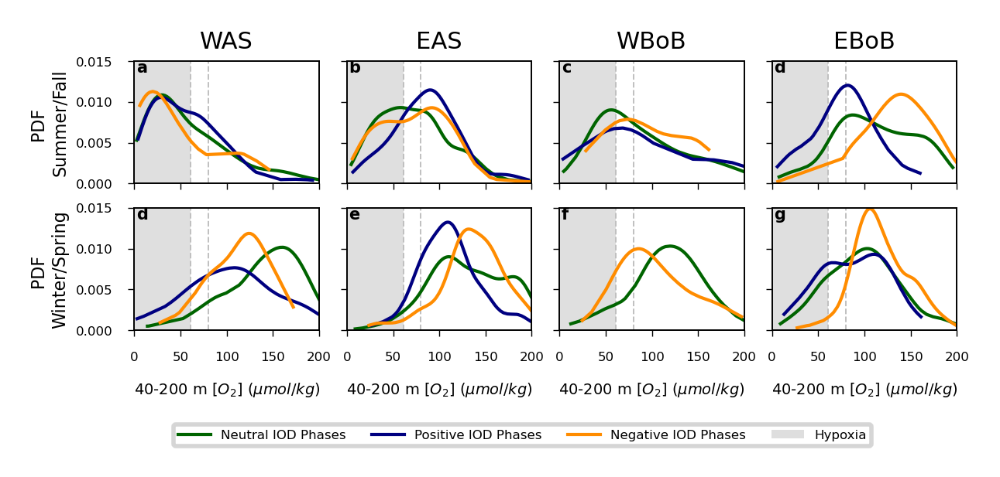

In [14]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# DMI
ds_DMI= xr.open_dataset('../data_processing/3_DMI/dmi_processed.nc')

posIODyears = list(np.array(ds_DMI.pos_IOD_years))
sposIODyears = list(np.array(ds_DMI.spos_IOD_years))
negIODyears = list(np.array(ds_DMI.neg_IOD_years))
neuIODyears = list(np.array(ds_DMI.neu_IOD_years)) 

depth = '40_200'
Depth = '40-200'
############################################################################################################
# Western Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_wAS_' + depth]
lat = ds_WOD.lat_wAS
lon = ds_WOD.lon_wAS
t = ds_WOD.time_wAS

# positive IOD years -------------------------------------------# 
posIODdata_wAS,_,_,posIODtime_wAS,posIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wAS')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wAS,_,_,sposIODtime_wAS,sposIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wAS')

# negative IOD years -------------------------------------------# 
negIODdata_wAS,_,_,_,negIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_wAS,_,_,_,neuIODmon_wAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wAS')

############################################################################################################
# Eastern Arabian Sea
############################################################################################################
doxy = ds_WOD['doxy_eAS_' + depth]
lat = ds_WOD.lat_eAS
lon = ds_WOD.lon_eAS
t = ds_WOD.time_eAS

# positive IOD years -------------------------------------------# 
posIODdata_eAS,_,_,_,posIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eAS')

# strong positive IOD years -------------------------------------------# 
sposIODdata_eAS,_,_,_,sposIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eAS')

# negative IOD years -------------------------------------------# 
negIODdata_eAS,_,_,_,negIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eAS')

# neutral IOD years -------------------------------------------# 
neuIODdata_eAS,_,_,_,neuIODmon_eAS,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eAS')

############################################################################################################
# Western Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_wBoB_' + depth]
lat = ds_WOD.lat_wBoB
lon = ds_WOD.lon_wBoB
t = ds_WOD.time_wBoB

# positive IOD years -------------------------------------------# 
posIODdata_wBoB,_,_,_,posIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'wBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_wBoB,_,_,_,sposIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'wBoB')
# negative IOD years -------------------------------------------# 
negIODdata_wBoB,_,_,_,negIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'wBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_wBoB,_,_,_,neuIODmon_wBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'wBoB')

############################################################################################################
# Eastern Bay of Bengal
############################################################################################################
doxy = ds_WOD['doxy_eBoB_' + depth]
lat = ds_WOD.lat_eBoB
lon = ds_WOD.lon_eBoB
t = ds_WOD.time_eBoB

# positive IOD years -------------------------------------------# 
posIODdata_eBoB,_,_,_,posIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             posIODyears, region = 'eBoB')
# strong positive IOD years -------------------------------------------# 
sposIODdata_eBoB,_,_,_,sposIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             sposIODyears, region = 'eBoB')
# negative IOD years -------------------------------------------# 
negIODdata_eBoB,_,_,_,negIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             negIODyears, region = 'eBoB')

# neutral IOD years -------------------------------------------# 
neuIODdata_eBoB,_,_,_,neuIODmon_eBoB,_ = IOD_year_group_WOD(doxy,
                                             lat,lon,t,
                                             IODyear_begin,IODyear_end,
                                             neuIODyears, region = 'eBoB')

# Make Histograms 
# hatch_mask = min_mean > hyp_thresh
x = [1,2,3,4]

fig = plt.figure(figsize=(8.7 / 2.54, 1.5), dpi=400)

params = {'legend.fontsize': 3,
         'axes.labelsize': 3.5,
         'axes.titlesize': 5.5,
         'xtick.labelsize':3,
         'ytick.labelsize':3,
         'axes.linewidth':0.35,
         'xtick.major.width':0.25,
         'xtick.major.size':1.5,
         'ytick.major.width':0.25,
         'ytick.major.size':1.5}
pylab.rcParams.update(params)

text_fz = 4.5
sq_sz = 20
lfz = 3.75
width = 0.2
lw = 0.75

# clrs = ['darkgreen','darkorange','navy','darkorchid', 'darkgreen']
clrs = ['darkgreen','navy','darkorange','darkorchid', 'darkgreen']
labels = ['Neutral IOD Phases','Positive IOD Phases','Negative IOD Phases','Hypoxia']
letters = ['a','b','c','d','e','f','g','h']

regions = ['WAS','EAS','WBoB','EBoB']

####################################################################################################

data_wAS = [neuIODdata_wAS,posIODdata_wAS,negIODdata_wAS,sposIODdata_wAS]
data_eAS = [neuIODdata_eAS,posIODdata_eAS,negIODdata_eAS,sposIODdata_eAS]
data_wBoB = [neuIODdata_wBoB,posIODdata_wBoB,negIODdata_wBoB,sposIODdata_wBoB]
data_eBoB = [neuIODdata_eBoB,posIODdata_eBoB,negIODdata_eBoB,sposIODdata_eBoB]

time_data_wAS = [neuIODmon_wAS,posIODmon_wAS,negIODmon_wAS,sposIODmon_wAS]
time_data_eAS = [neuIODmon_eAS,posIODmon_eAS,negIODmon_eAS,sposIODmon_eAS]
time_data_wBoB = [neuIODmon_wBoB,posIODmon_wBoB,negIODmon_wBoB,sposIODmon_wBoB]
time_data_eBoB = [neuIODmon_eBoB,posIODmon_eBoB,negIODmon_eBoB,sposIODmon_eBoB]

cnt = 1
for pp in range(4):

    if pp==0:
        sdata = data_wAS[0]
        pdata = data_wAS[1]
        ndata = data_wAS[2]
        spdata = data_wAS[3]
        
        stdata = time_data_wAS[0]
        ptdata = time_data_wAS[1]
        ntdata = time_data_wAS[2]
        sptdata = time_data_wAS[3]

    elif pp==1:
        sdata = data_eAS[0]
        pdata = data_eAS[1]
        ndata = data_eAS[2]
        spdata = data_eAS[3]
        
        stdata = time_data_eAS[0]
        ptdata = time_data_eAS[1]
        ntdata = time_data_eAS[2]
        sptdata = time_data_eAS[3]

    elif pp==2:
        sdata = data_wBoB[0]
        pdata = data_wBoB[1]
        ndata = data_wBoB[2]
        spdata = data_wBoB[3]
        
        stdata = time_data_wBoB[0]
        ptdata = time_data_wBoB[1]
        ntdata = time_data_wBoB[2]
        sptdata = time_data_wBoB[3]

    else:
        sdata = data_eBoB[0]
        pdata = data_eBoB[1]
        ndata = data_eBoB[2]
        spdata = data_eBoB[3]
        
        stdata = time_data_eBoB[0]
        ptdata = time_data_eBoB[1]
        ntdata = time_data_eBoB[2]
        sptdata = time_data_eBoB[3]

    # O2
    x1 = sdata[~np.isnan(sdata)]
    x2 = pdata[~np.isnan(pdata)]
    x3 = ndata[~np.isnan(ndata)]
    x4 = spdata[~np.isnan(spdata)]

    x1t = stdata[~np.isnan(sdata)]
    x2t = ptdata[~np.isnan(pdata)]
    x3t = ntdata[~np.isnan(ndata)]
    x4t = sptdata[~np.isnan(spdata)]

    # get seasonal indicies
    ind_sf = (x1t == 6) | (x1t == 7) | (x1t == 8) | (x1t == 9) | (x1t == 10) | (x1t == 11)
    ind_ws = (x1t == 12) | (x1t == 1) | (x1t == 2) | (x1t == 3) | (x1t == 4) | (x1t ==5)

    x1_sf = x1[ind_sf]
    x1_ws = x1[ind_ws]

    ind_sf = (x2t == 6) | (x2t == 7) | (x2t == 8) | (x2t == 9) | (x2t == 10) | (x2t == 11)
    ind_ws = (x2t == 12) | (x2t == 1) | (x2t == 2) | (x2t == 3) | (x2t == 4) | (x2t ==5)

    x2_sf = x2[ind_sf]
    x2_ws = x2[ind_ws]

    ind_sf = (x3t == 6) | (x3t == 7) | (x3t == 8) | (x3t == 9) | (x3t == 10) | (x3t == 11)
    ind_ws = (x3t == 12) | (x3t == 1) | (x3t == 2) | (x3t == 3) | (x3t == 4) | (x3t ==5)

    x3_sf = x3[ind_sf]
    x3_ws = x3[ind_ws]
    
    ind_sf = (x4t == 6) | (x4t == 7) | (x4t == 8) | (x4t == 9) | (x4t == 10) | (x4t == 11)
    ind_ws = (x4t == 12) | (x4t == 1) | (x4t == 2) | (x4t == 3) | (x4t == 4) | (x4t ==5)

    x4_sf = x4[ind_sf]
    x4_ws = x4[ind_ws]

    # summer/fall --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', linewidth = 0)
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)
    
    
    # seasonal 
    tmp = np.sort(x1_sf)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[0])
    
    # positive IOD
    tmp = np.sort(x2_sf)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[1])
    
    # negative IOD
    tmp = np.sort(x3_sf)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[2])

    
    if cnt == 1:
        ax.set_ylabel('PDF \nSummer/Fall', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
        
    ax.set_title(regions[pp], pad = 3)
    ax.set_xticklabels([])
        
    ax.set_xlim([0,200])
    ax.set_ylim([0,0.015])
    add_letter(ax, letters[cnt-1], x = 0.01,y=0.91, fontsize = lfz)

    # winter/spring --------------------------------------------------------------- #
    ax = fig.add_subplot(2,4,cnt + 4)
    ax.axvspan(-100, hyp_thresh, alpha=0.5, color='silver', linewidth = 0,label = labels[3])
    ax.axvline(x = hyp_thresh,color = 'silver',linestyle = '--', linewidth = 0.35)
    ax.axvline(x = 80,color = 'silver',linestyle = '--', linewidth = 0.35)

        # seasonal 
    tmp = np.sort(x1_ws)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[0], label = labels[0])
    
    # positive IOD
    tmp = np.sort(x2_ws)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[1], label = labels[1])
    
    # negative IOD
    tmp = np.sort(x3_ws)
    if len(tmp)>1:
        kernel = stats.gaussian_kde(tmp)
        plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[2], label = labels[2])
    
#     # strong positive IOD 
#     tmp = np.sort(x4_ws)
#     if len(tmp)>1:
#         kernel = stats.gaussian_kde(tmp)
#         plt.plot(tmp,kernel(tmp), linewidth = lw, color = clrs[1], linestyle = '--')
        
    ax.set_xlim([0,200])
    ax.set_ylim([0,0.015])
    if cnt == 1:
        ax.set_ylabel('PDF \nWinter/Spring', fontsize = 4,labelpad = 1.5)
    else:
        ax.set_yticklabels([])
    ax.set_xlabel(Depth + ' m [$O_2$] ($\mu mol/ kg$)')
    add_letter(ax, letters[cnt+2], x = 0.01,y=0.91, fontsize = lfz)
    
    cnt += 1

ax.legend(loc='lower center', bbox_to_anchor=(-1.35, -1),
          ncol=5, handlelength = 2.5)

plt.subplots_adjust(wspace = 0.15, bottom = 0.3)

plt.savefig(figpath + 'Fig_S11_pdfs_'+depth+'.pdf', format='pdf', dpi = 400)




# S12 - SLA Correlations 40-200m

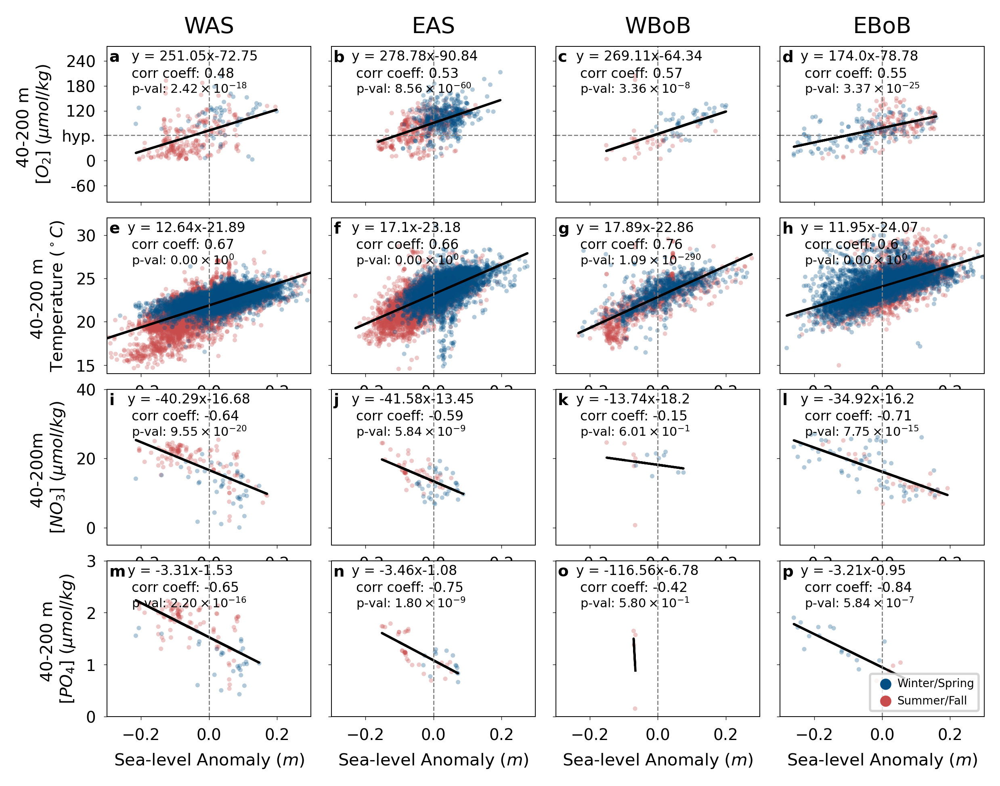

In [15]:
#WOD
ds_WOD = xr.open_dataset('../data_processing/1_WOD_Coastal/wod_coastal_processed.nc')

# SLA
ds_SLA = xr.open_dataset('../data_processing/6_Regridding/sla_to_wod.nc')

depth = '40_200'
Depth = '40-200'
############################################################################
doxy_wAS = ds_WOD['doxy_wAS_' + depth]
doxy_eAS = ds_WOD['doxy_eAS_' + depth]
doxy_wBoB = ds_WOD['doxy_wBoB_' + depth]
doxy_eBoB = ds_WOD['doxy_eBoB_' + depth]

sla_wAS = ds_SLA['sla_wAS']
sla_eAS = ds_SLA['sla_eAS']
sla_wBoB = ds_SLA['sla_wBoB']
sla_eBoB = ds_SLA['sla_eBoB']

seas_wAS = ds_WOD['seas_wAS']
seas_eAS = ds_WOD['seas_eAS']
seas_wBoB = ds_WOD['seas_wBoB']
seas_eBoB = ds_WOD['seas_eBoB']

temp_wAS = ds_WOD['temp_wAS_' + depth]
temp_eAS = ds_WOD['temp_eAS_' + depth]
temp_wBoB = ds_WOD['temp_wBoB_' + depth]
temp_eBoB = ds_WOD['temp_eBoB_' + depth]

nitrate_wAS = ds_WOD['nitrate_wAS_' + depth]
nitrate_eAS = ds_WOD['nitrate_eAS_' + depth]
nitrate_wBoB = ds_WOD['nitrate_wBoB_' + depth]
nitrate_eBoB = ds_WOD['nitrate_eBoB_' + depth]

phosphate_wAS = ds_WOD['phosphate_wAS_' + depth]
phosphate_eAS = ds_WOD['phosphate_eAS_' + depth]
phosphate_wBoB = ds_WOD['phosphate_wBoB_' + depth]
phosphate_eBoB = ds_WOD['phosphate_eBoB_' + depth]
##############################################################
fig = plt.figure(figsize=(17.8 / 2.54,5.5),dpi=400)


regions = ['WAS','EAS','WBoB','EBoB']
sz = 4
fsz = 6
lfz = 7
lw = 1
alpha = .3


xlim = [-0.3,0.3]
ylim = [-100,275]

cmap = get_continuous_cmap(['#034f84','#92a8d1','#b7d7e8','#f0f0f0','#f7cac9','#f7786b','#c94c4c'])
s_clr = '#c94c4c'
w_clr = '#034f84'
piod_clr = 'darkgreen'
niod_clr = 'purple'

params = {'legend.fontsize': 5,
         'axes.labelsize': 7.5,
         'axes.titlesize': 10,
         'xtick.labelsize':7,
         'ytick.labelsize':7}

pylab.rcParams.update(params)

##############################################################

ax = fig.add_subplot(441)
var1 = sla_wAS
var2 = doxy_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.set_title(regions[0])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xticklabels([])
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_ylabel(Depth + ' m \n[$O_2$] ($\mu mol/ kg$)')
add_letter(ax, 'a', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.12,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(442)
var1 = sla_eAS
var2 = doxy_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.set_title(regions[1])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xticklabels([])
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])

add_letter(ax, 'b', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(443)
var1 = sla_wBoB
var2 = doxy_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.set_title(regions[2])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xticklabels([])
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'c', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(444)
var1 = sla_eBoB
var2 = doxy_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.set_title(regions[3])
ax.set_xlim(xlim)
ax.set_ylim(ylim)
ax.set_xticklabels([])
ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'd', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


#####################################################################
ylim = [14,32]

ax = fig.add_subplot(445)
var1 = sla_wAS
var2 = temp_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_ylabel(Depth + ' m \nTemperature ($^\circ C$)')
add_letter(ax, 'e', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)



ax = fig.add_subplot(446)
var1 = sla_eAS
var2 = temp_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'f', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


ax = fig.add_subplot(447)
var1 = sla_wBoB
var2 = temp_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'g', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(448)
var1 = sla_eBoB
var2 = temp_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'h', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

#####################################################################
ylim = [-5,40]

ax = fig.add_subplot(449)
var1 = sla_wAS
var2 = nitrate_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_ylabel(Depth + 'm \n[$NO_3$] ($\mu mol/ kg$)')
add_letter(ax, 'i', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)



ax = fig.add_subplot(4,4,10)
var1 = sla_eAS
var2 = nitrate_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'j', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


ax = fig.add_subplot(4,4,11)
var1 = sla_wBoB
var2 = nitrate_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'k', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(4,4,12)
var1 = sla_eBoB
var2 = nitrate_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
add_letter(ax, 'l', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)



#####################################################################
ylim = [0,3]

ax = fig.add_subplot(4,4,13)
var1 = sla_wAS
var2 = phosphate_wAS
seas = seas_wAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
# ax.set_yticklabels([-60,0,'hyp.',120,180,240])
ax.set_ylabel(Depth + ' m \n[$PO_4$] ($\mu mol/ kg$)')
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'm', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)



ax = fig.add_subplot(4,4,14)
var1 = sla_eAS
var2 = phosphate_eAS
seas = seas_eAS

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'n', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


ax = fig.add_subplot(4,4,15)
var1 = sla_wBoB
var2 = phosphate_wBoB
seas = seas_wBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'o', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)

ax = fig.add_subplot(4,4,16)
var1 = sla_eBoB
var2 = phosphate_eBoB
seas = seas_eBoB

ind = np.isnan(var1) | np.isnan(var2)
var1 = var1[~ind]
var2 = var2[~ind]
seas = seas[~ind]

#s/f
ind = seas == 1
ax.scatter(var1[ind],var2[ind],c = s_clr, s= sz,alpha = alpha, edgecolor = 'none')
#w/s
ind = seas == 0
ax.scatter(var1[ind],var2[ind],c = w_clr, s= sz,alpha = alpha, edgecolor = 'none')

m, b, r, p_val,_ =stats.linregress(var1, var2)
ax.plot(var1, m*var1 + b, 'k', linewidth = lw)
ax.axhline(y = hyp_thresh,color = 'gray',linestyle = '--', linewidth = 0.5)
ax.axvline(x = 0,color = 'gray',linestyle = '--', linewidth = 0.5)

ax.set_xlim(xlim)
ax.set_ylim(ylim)
# ax.set_yticks([-60,0,61,120,180,240])
ax.set_yticklabels([])
ax.set_xlabel('Sea-level Anomaly ($m$)')
add_letter(ax, 'p', x = 0.01,y=0.9, fontsize = lfz)
add_text(ax, 'y = ' + str(np.round(m,2)) + 'x-' + str(np.round(np.abs(b),2)), x = 0.1,y=0.91, fontsize = fsz)
add_text(ax, 'corr coeff: ' + str(np.round(r,2)), x = 0.12,y=0.8, fontsize = fsz)
add_text(ax, 'p-val: ' + r'${0:s}$'.format(as_si(p_val,2)), x = 0.12,y=0.7, fontsize = fsz-0.5)


ax.scatter(np.nan,np.nan,c = w_clr, s= sz, edgecolor = 'none', label = 'Winter/Spring')
ax.scatter(np.nan,np.nan,c = s_clr, s= sz, edgecolor = 'none', label = 'Summer/Fall')
# ax.axhline(y = -1,color = 'gray',linestyle = '--', linewidth = 0.5, label = 'hypoxia')
plt.legend(loc = 'lower right', handletextpad = 0.001, markerscale = 2.5)

plt.subplots_adjust(wspace = 0.1,hspace = 0.1)

plt.savefig(figpath + 'Fig_S12_sla_corr_o2_temp_nit_phos_' + depth + '.pdf', format='pdf', dpi = 400)


